Inspirado no What does BERT learn about the structure of language?  
Investiga como o BERT captura informações estruturais da língua.  
> If the auxiliary classifier can predict a linguistic property well, then the original model likely encodes that property.

In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import csv

from datasets import Dataset, features

from llm_mri import ActivationAreas
from llm_mri.dimensionality_reduction import UMAP

import sys
sys.path.insert(0, '../../') 
from utils.layers import get_metric_function, merge_data_from_dicts

/usr/local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# constants
RAW_DATASET_PATH = "../data/raw/"
INTERIM_DATASET_PATH = "../data/interim/"
PROCESSED_DATASET_PATH = "../data/processed/"
GRAPH_PATH = f"{INTERIM_DATASET_PATH}graphs/"
COMPLETE_GRAPH_PATH = f"{GRAPH_PATH}complete/"
FILTERED_GRAPH_PATH = f"{GRAPH_PATH}filtered/"
DATASETS_NAMES = ["subj_number", "tree_depth", "word_content", "bigram_shift", "odd_man_out", "sentence_length"]

DATASETS_MAP = {
  "surface": ["sentence_length", "word_content"],
  "syntactic": ["bigram_shift", "tree_depth"],
  "semantic": ["odd_man_out", "subj_number"]
}

model_ckpt = "bert-base-uncased"

# Run LLM-MRI and Save Graphs

In [6]:
labels = dict()
for dataset_name in DATASETS_NAMES:

    print(f"Processing dataset: {dataset_name}")
    # 1. Carregar o arquivo .txt (ajuste o caminho conforme necessário)
    # O separador costuma ser tabulação ou espaço, dependendo da versão
    df = pd.read_csv(
        f"{RAW_DATASET_PATH}{dataset_name}.txt",
        sep="\t",
        names=["split", "label", "text"],
        quoting=csv.QUOTE_NONE
    )

    print(f"Dataset '{dataset_name}' carregado com {len(df)} amostras.")

    # 2. Filtrar apenas o que você deseja (ex: apenas o split de treino 'tr')
    df = df.drop(columns=["split"])

    # 3. Criar o Dataset do Hugging Face (como feito no notebook Emotions.ipynb)
    dataset = Dataset.from_pandas(df.reset_index(drop=True))

    # 4. Mapear as labels para ClassLabel (essencial para o LLM-MRI)
    class_names = [str(x) for x in sorted(dataset.unique("label"))]
    labels[dataset_name] = class_names
    class_feature = features.ClassLabel(names=class_names)
    dataset = dataset.map(lambda x: {"label": class_feature.str2int(str(x["label"]))})
    dataset = dataset.cast(
        features.Features({"label": class_feature, "text": dataset.features["text"]})
    )

    # 5. Processar as áreas de ativação usando o LLM-MRI

    umap = UMAP(n_components=2, random_state=42, gridsize=15)
    llm_mri = ActivationAreas(
        model=model_ckpt, device="cpu", dataset=dataset, reduction_method=umap
    )
    llm_mri.process_activation_areas(
        # save_raw_path="data/dados_hf_brutos",
        # save_reduced_path="data/reduzidos.pt",
        save_jsonl_path=f"{INTERIM_DATASET_PATH}/{dataset_name}_features.json"
    )

    for label in class_names:
        current_graph = llm_mri.get_graph(label)
        nx.write_gexf(
            current_graph, f"{COMPLETE_GRAPH_PATH}/g_{label}_{dataset_name}.gexf"
        )

    total_graph = llm_mri.get_graph(class_names)
    nx.write_gexf(total_graph, f"{COMPLETE_GRAPH_PATH}/g_total_{dataset_name}.gexf")

Processing dataset: subj_number
Dataset 'subj_number' carregado com 10000 amostras.


Map: 100%|██████████| 10000/10000 [03:03<00:00, 54.48 examples/s]


Saving raw features in extract_features format to: ../data/interim//subj_number_features.json, length of dataset: 10000...
Exporting features in extract_features format to: ../data/interim//subj_number_features.json...
JSONL file saved successfully!


/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

Processing dataset: tree_depth
Dataset 'tree_depth' carregado com 9996 amostras.


Map: 100%|██████████| 9996/9996 [03:33<00:00, 46.91 examples/s]


Saving raw features in extract_features format to: ../data/interim//tree_depth_features.json, length of dataset: 9996...
Exporting features in extract_features format to: ../data/interim//tree_depth_features.json...
JSONL file saved successfully!


/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

Processing dataset: word_content
Dataset 'word_content' carregado com 10000 amostras.


Map: 100%|██████████| 10000/10000 [03:24<00:00, 48.94 examples/s]


Saving raw features in extract_features format to: ../data/interim//word_content_features.json, length of dataset: 10000...
Exporting features in extract_features format to: ../data/interim//word_content_features.json...
JSONL file saved successfully!


/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

Processing dataset: bigram_shift
Dataset 'bigram_shift' carregado com 10000 amostras.


Map: 100%|██████████| 10000/10000 [03:16<00:00, 50.99 examples/s]


Saving raw features in extract_features format to: ../data/interim//bigram_shift_features.json, length of dataset: 10000...
Exporting features in extract_features format to: ../data/interim//bigram_shift_features.json...
JSONL file saved successfully!


/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

Processing dataset: odd_man_out
Dataset 'odd_man_out' carregado com 10000 amostras.


Map: 100%|██████████| 10000/10000 [03:36<00:00, 46.09 examples/s]


Saving raw features in extract_features format to: ../data/interim//odd_man_out_features.json, length of dataset: 10000...
Exporting features in extract_features format to: ../data/interim//odd_man_out_features.json...
JSONL file saved successfully!


/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

Processing dataset: sentence_length
Dataset 'sentence_length' carregado com 9996 amostras.


Map: 100%|██████████| 9996/9996 [03:28<00:00, 47.94 examples/s]


Saving raw features in extract_features format to: ../data/interim//sentence_length_features.json, length of dataset: 9996...
Exporting features in extract_features format to: ../data/interim//sentence_length_features.json...
JSONL file saved successfully!


/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

### Show Graphs

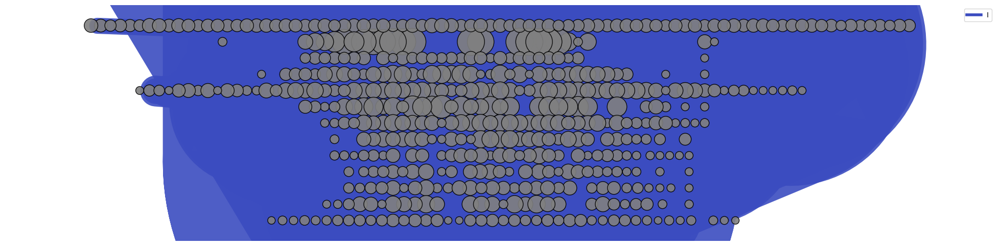

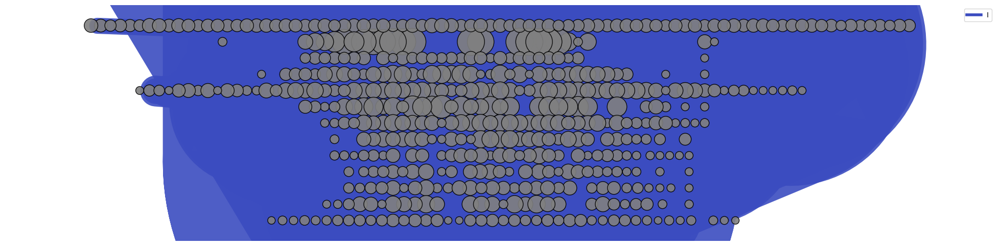

In [6]:
llm_mri.get_graph_image(g_I, fix_node_positions=True)

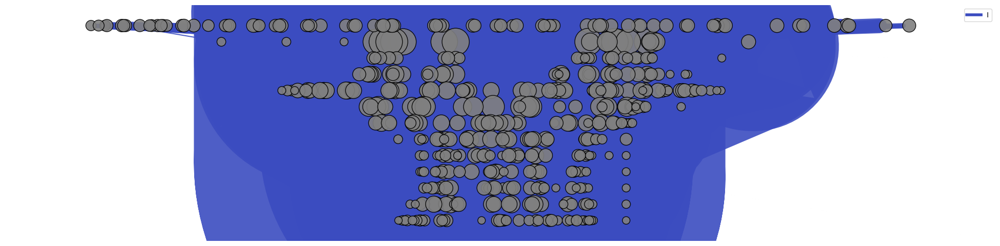

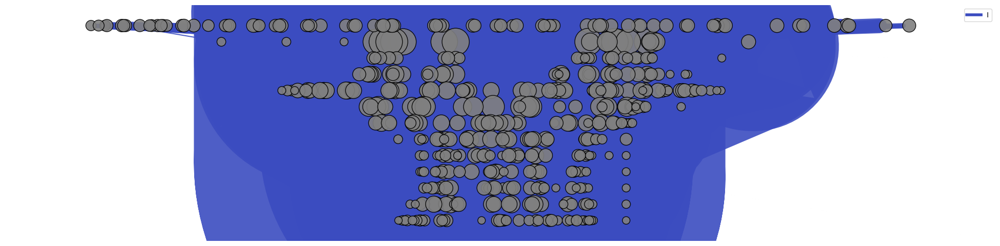

In [7]:
llm_mri.get_graph_image(g_I, fix_node_positions=False)


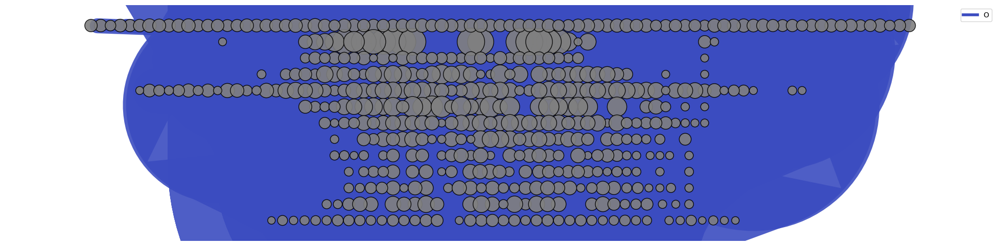

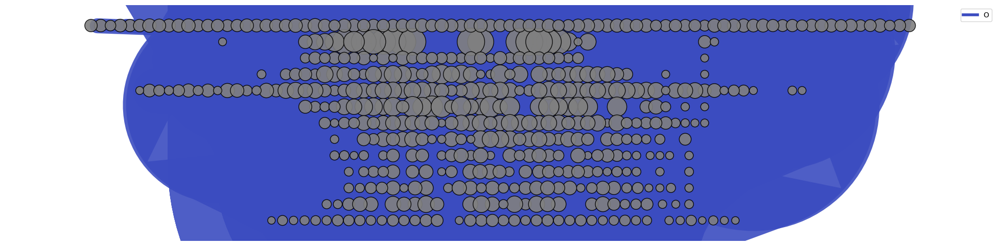

In [8]:
llm_mri.get_graph_image(g_O, fix_node_positions=True)

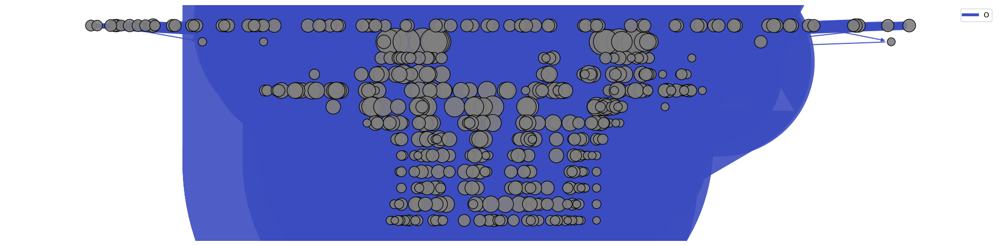

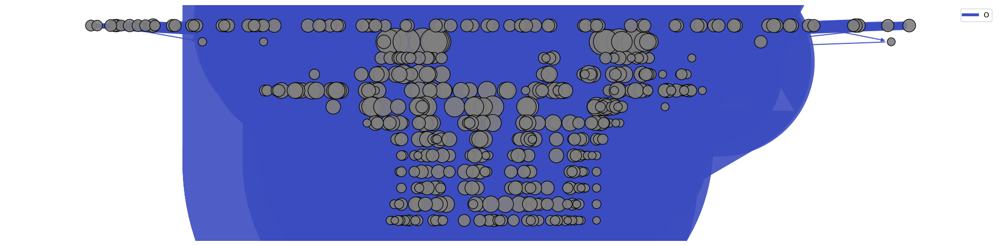

In [9]:
llm_mri.get_graph_image(g_O, fix_node_positions=False)


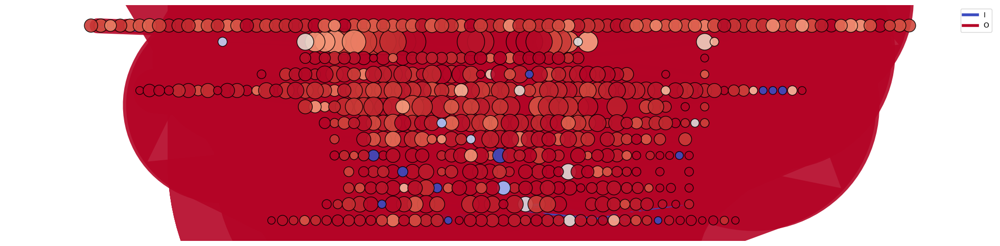

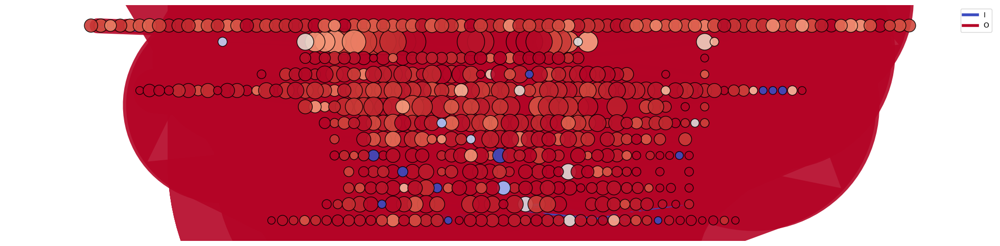

In [10]:
llm_mri.get_graph_image(g_total, fix_node_positions=True)


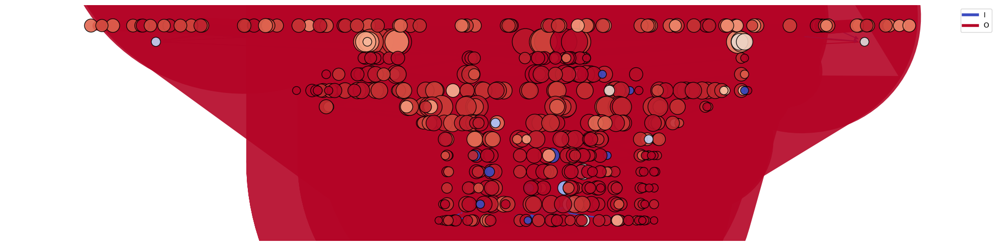

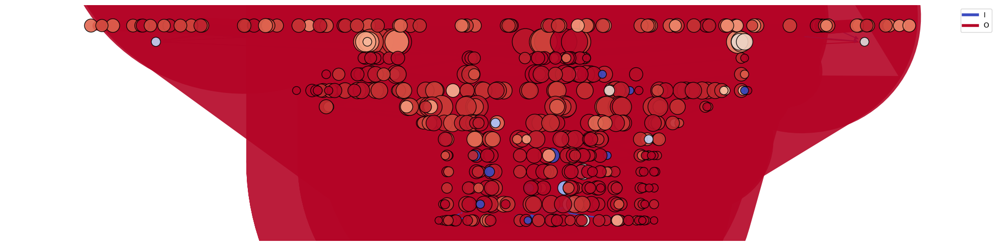

In [11]:
llm_mri.get_graph_image(g_total, fix_node_positions=False)


# Get Metrics by Layer

In [3]:
def dict_to_dataframe(metrics_per_layer_dict):
  # Separando métricas por nó e por aresta
  node_metrics = {k: v for k, v in metrics_per_layer_dict.items() 
                  if 'edge' not in k}
  edge_metrics = {k: v for k, v in metrics_per_layer_dict.items() 
                  if 'edge' in k}

  # DataFrame de métricas por camada (nó)
  df_nodes = pd.DataFrame(node_metrics)
  df_nodes.index.name = 'layer'
  df_nodes = df_nodes.reset_index()

  # DataFrame de métricas por aresta entre camadas
  df_edges = pd.DataFrame(edge_metrics)
  df_edges.index.name = 'layer_pair'
  df_edges = df_edges.reset_index()

  # Extrair a camada inicial e criar identificador
  df_edges['layer'] = df_edges['layer_pair'].apply(lambda x: int(x.split('>>')[0]))

  # Renomear colunas de arestas
  edge_cols = {col: f'edge_{col}' for col in df_edges.columns if col != 'layer' and col != 'layer_pair'}
  df_edges = df_edges.rename(columns=edge_cols)

  # Fazer merge apenas mantendo layer e layer_pair
  df_combined = pd.merge(df_nodes, df_edges[['layer', 'layer_pair'] + list(edge_cols.values())], 
                        on='layer', how='left')

  # Criar coluna de descrição
  df_combined.insert(1, 'layer_description', 
                    df_combined.apply(lambda row: f"{row['layer']} ({row['layer_pair']})" 
                                      if pd.notna(row['layer_pair']) else str(row['layer']), axis=1))

  # Remover layer_pair se quiser
  return df_combined.drop('layer_pair', axis=1)

In [4]:
def filter_and_plot_edges(caminho_entrada, caminho_saida, threshold=1):
    try:
        print("============================================")
        print(f"Processando o grafo: {caminho_entrada}")
        G = nx.read_gexf(caminho_entrada)
        
        # 1. Coletar pesos originais
        pesos_antes = [d.get('weight', 1) for u, v, d in G.edges(data=True)]
        
        # 2. Identificar e remover arestas
        arestas_para_remover = [
            (u, v) for u, v, d in G.edges(data=True)
            if d.get('weight', 0) <= threshold
        ]
        
        G.remove_edges_from(arestas_para_remover)
        
        # 3. Coletar pesos depois (os que sobraram)
        pesos_depois = [d.get('weight', 1) for u, v, d in G.edges(data=True)]
        
        if len(pesos_depois) < 10:
            print(f"Nenhuma aresta restante após a filtragem ({caminho_entrada}). Use original graph.")
            nx.write_gexf(nx.read_gexf(caminho_entrada), caminho_saida)
            
            return

        # 4. Gerar os Gráficos
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

        # Histograma Antes
        ax1.hist(pesos_antes, bins=30, color='skyblue', edgecolor='black')
        ax1.set_title(f'Antes do Filtro (Total: {len(pesos_antes)})')
        ax1.set_xlabel('Peso da Aresta')
        ax1.set_ylabel('Frequência')

        # Histograma Depois
        ax2.hist(pesos_depois, bins=30, color='salmon', edgecolor='black')
        ax2.set_title(f'Depois do Filtro (Total: {len(pesos_depois)})')
        ax2.set_xlabel('Peso da Aresta')

        plt.tight_layout()
        plt.show()

        # 5. Salvar o novo grafo
        nx.write_gexf(G, caminho_saida)
        print(f"Removidas {len(arestas_para_remover)} arestas.")
        print(f"Grafo salvo em: {caminho_saida}")
        
    except Exception as e:
        print(f"Erro ao processar o grafo: {e}")

In [4]:
def get_labels_dict():
  d = dict()
  for dataset_name in DATASETS_NAMES:
    df = pd.read_csv(
        f"{RAW_DATASET_PATH}{dataset_name}.txt",
        sep="\t",
        names=["split", "label", "text"],
        quoting=csv.QUOTE_NONE
    )    
    d[dataset_name] = sorted(df['label'].unique().tolist())
    d[dataset_name].append('total')
  return d

Processando o grafo: ../data/interim/graphs/complete/g_NN_subj_number.gexf


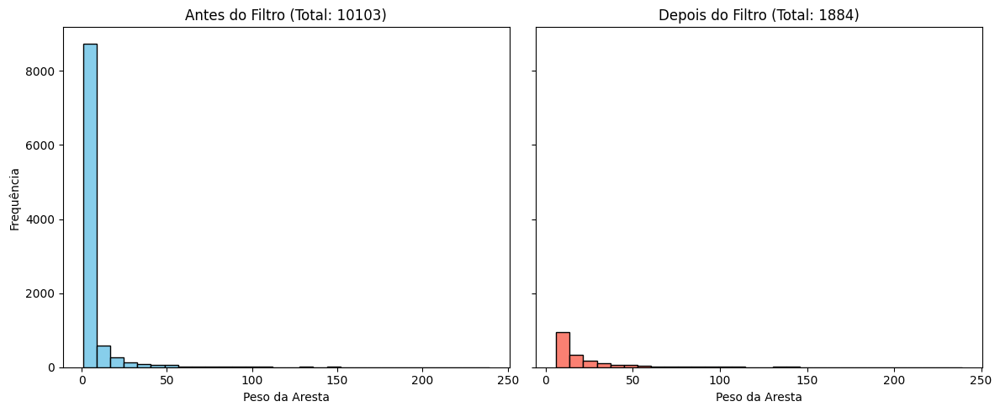

Removidas 8219 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_NN_subj_number.gexf
Processando o grafo: ../data/interim/graphs/complete/g_NNS_subj_number.gexf


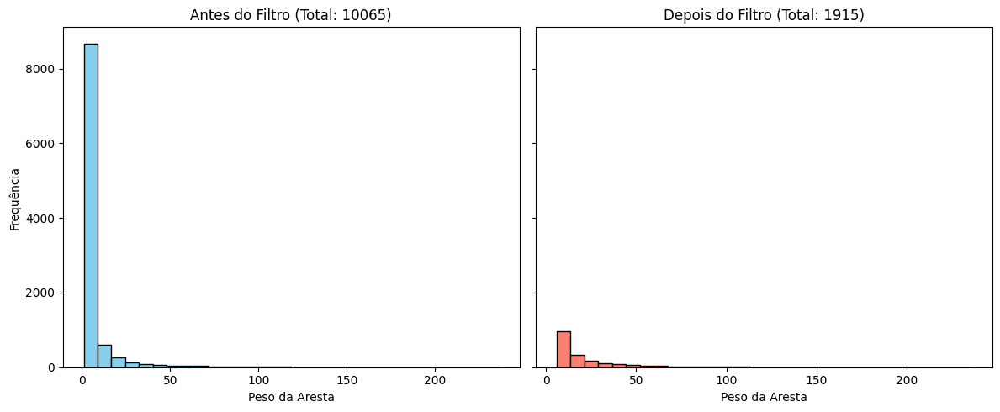

Removidas 8150 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_NNS_subj_number.gexf
Processando o grafo: ../data/interim/graphs/complete/g_total_subj_number.gexf


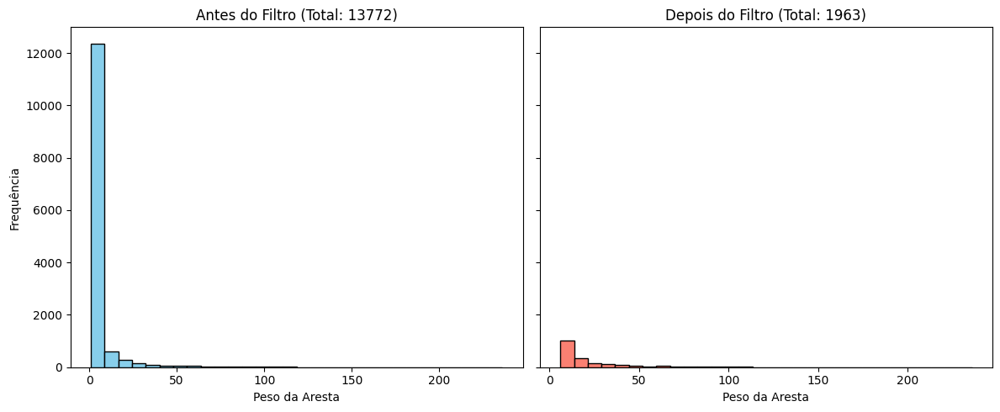

Removidas 11809 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_total_subj_number.gexf
Processando o grafo: ../data/interim/graphs/complete/g_5_tree_depth.gexf


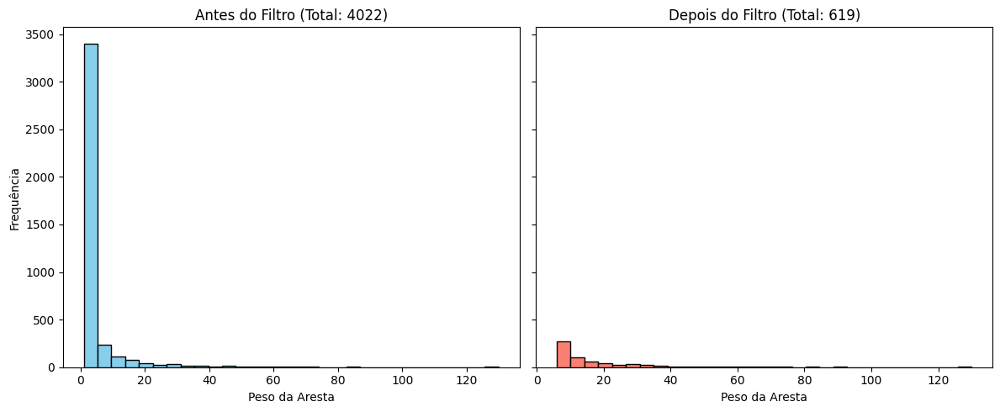

Removidas 3403 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_5_tree_depth.gexf
Processando o grafo: ../data/interim/graphs/complete/g_6_tree_depth.gexf


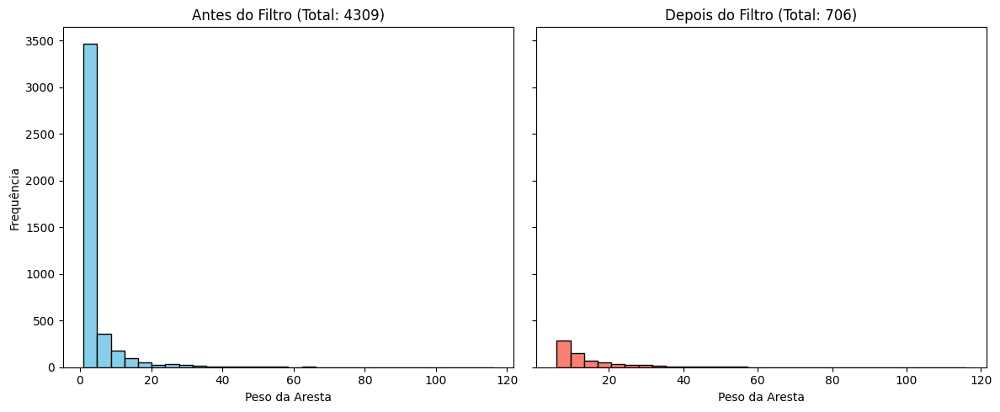

Removidas 3603 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_6_tree_depth.gexf
Processando o grafo: ../data/interim/graphs/complete/g_7_tree_depth.gexf


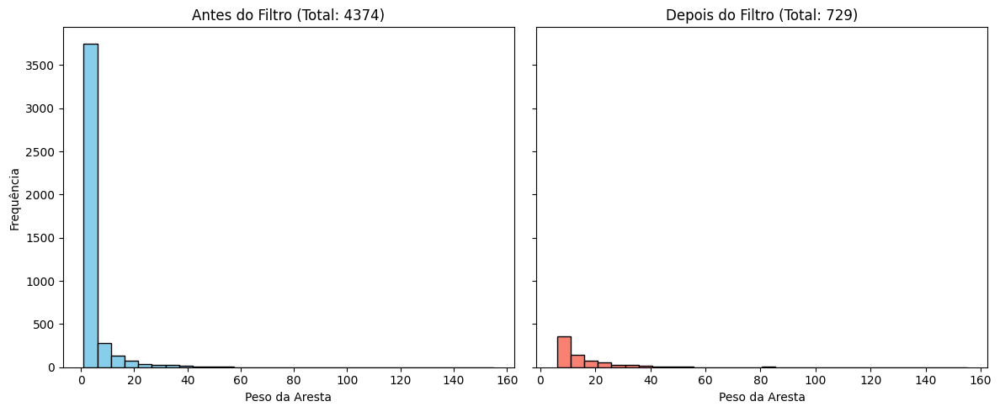

Removidas 3645 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_7_tree_depth.gexf
Processando o grafo: ../data/interim/graphs/complete/g_8_tree_depth.gexf


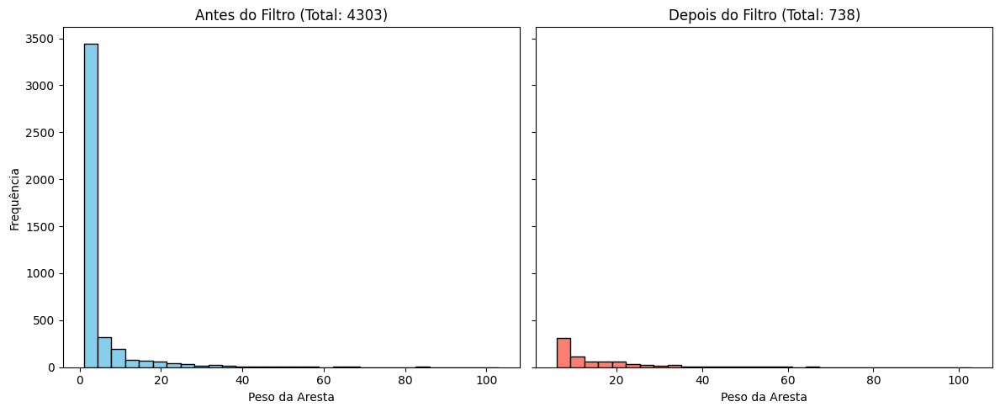

Removidas 3565 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_8_tree_depth.gexf
Processando o grafo: ../data/interim/graphs/complete/g_9_tree_depth.gexf


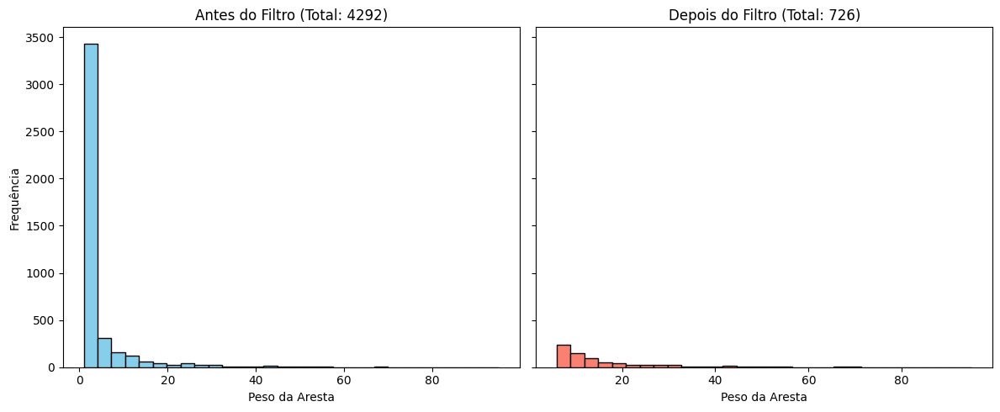

Removidas 3566 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_9_tree_depth.gexf
Processando o grafo: ../data/interim/graphs/complete/g_10_tree_depth.gexf


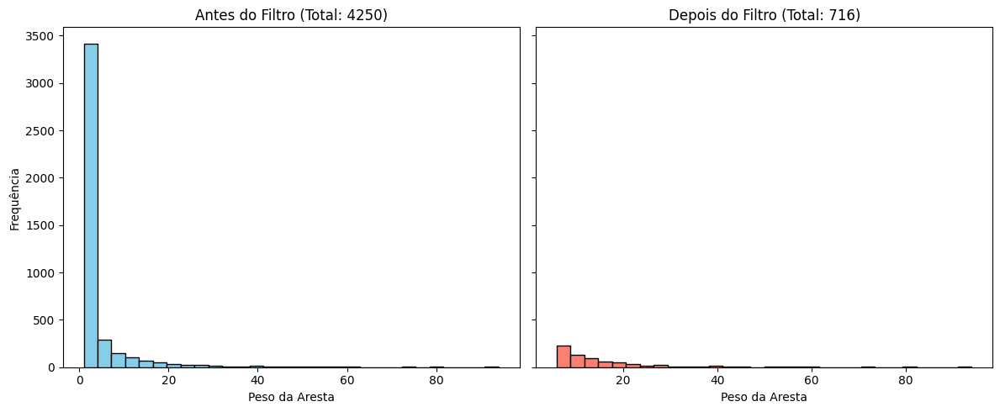

Removidas 3534 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_10_tree_depth.gexf
Processando o grafo: ../data/interim/graphs/complete/g_11_tree_depth.gexf


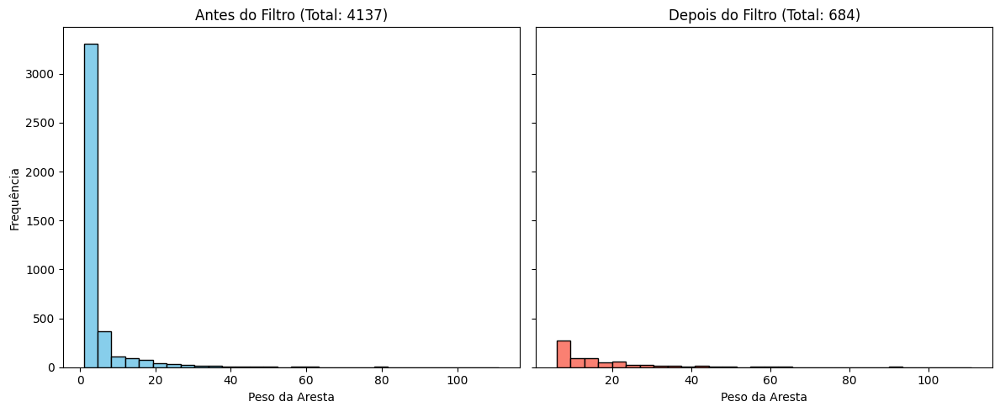

Removidas 3453 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_11_tree_depth.gexf
Processando o grafo: ../data/interim/graphs/complete/g_total_tree_depth.gexf


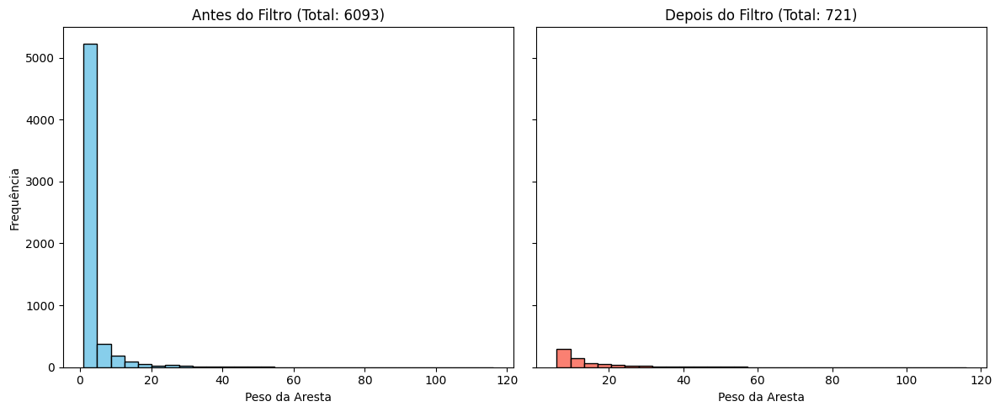

Removidas 5372 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_total_tree_depth.gexf
skipping word_content - 1_000 labels found
Processando o grafo: ../data/interim/graphs/complete/g_I_bigram_shift.gexf


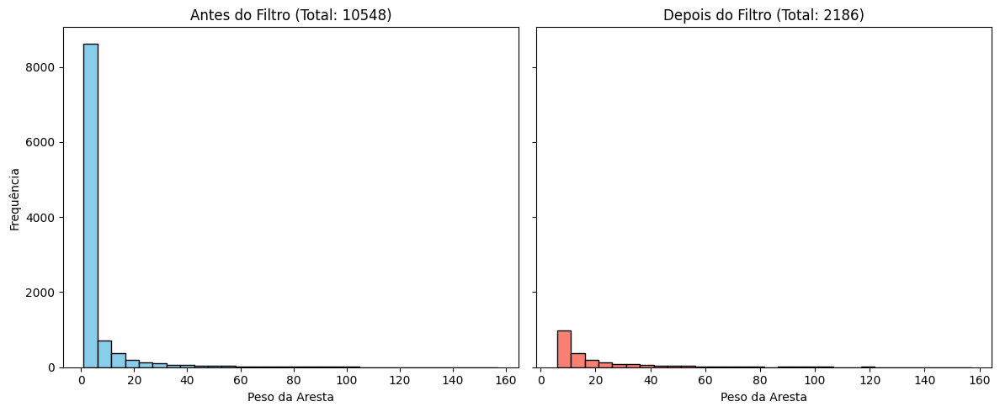

Removidas 8362 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_I_bigram_shift.gexf
Processando o grafo: ../data/interim/graphs/complete/g_O_bigram_shift.gexf


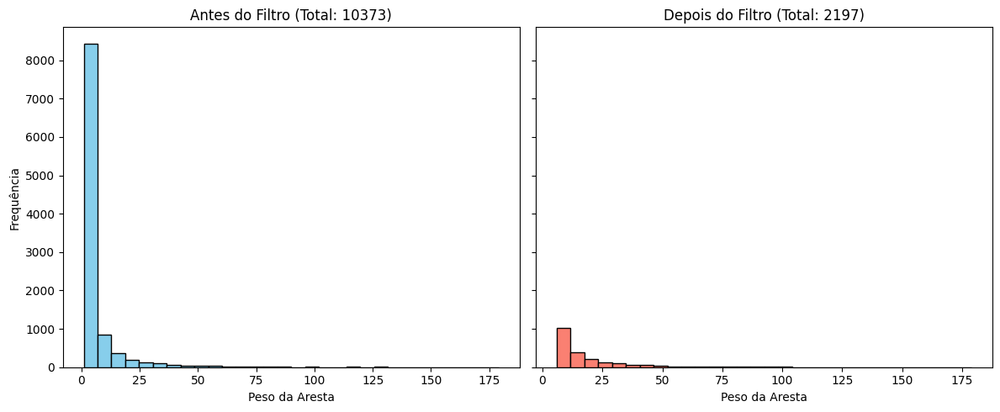

Removidas 8176 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_O_bigram_shift.gexf
Processando o grafo: ../data/interim/graphs/complete/g_total_bigram_shift.gexf


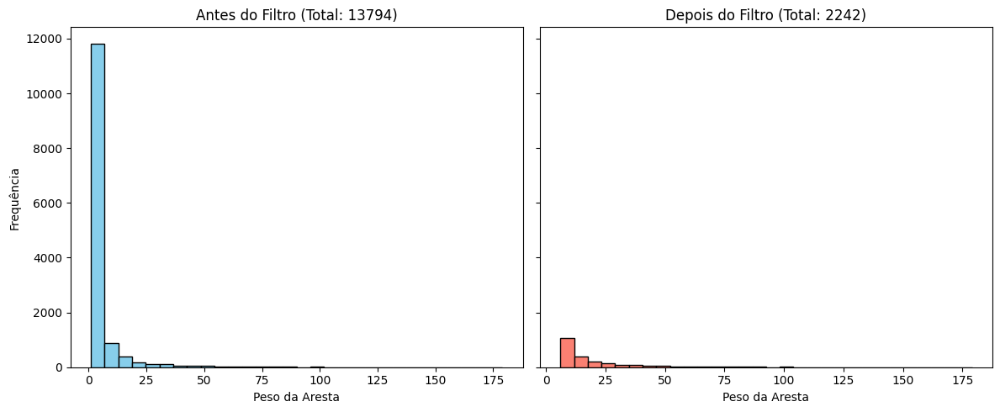

Removidas 11552 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_total_bigram_shift.gexf
Processando o grafo: ../data/interim/graphs/complete/g_C_odd_man_out.gexf


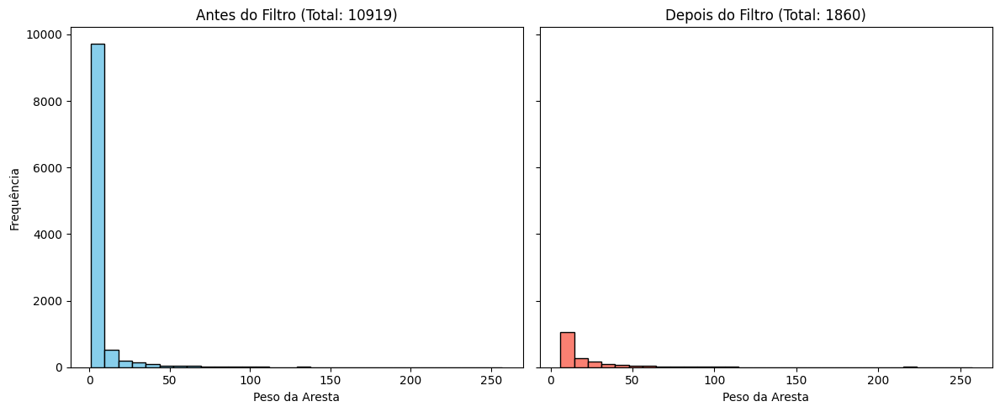

Removidas 9059 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_C_odd_man_out.gexf
Processando o grafo: ../data/interim/graphs/complete/g_O_odd_man_out.gexf


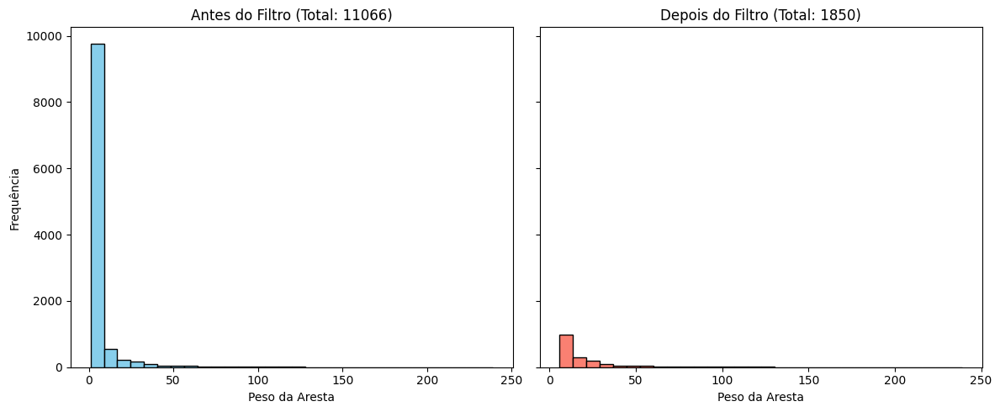

Removidas 9216 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_O_odd_man_out.gexf
Processando o grafo: ../data/interim/graphs/complete/g_total_odd_man_out.gexf


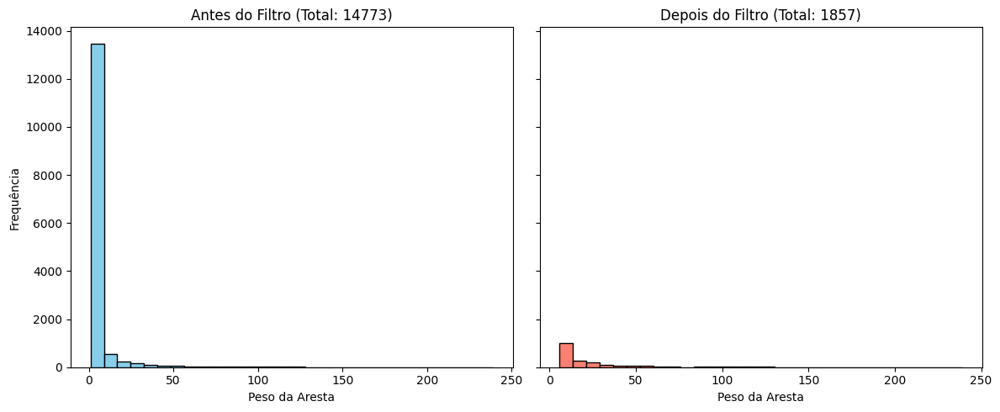

Removidas 12916 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_total_odd_man_out.gexf
Processando o grafo: ../data/interim/graphs/complete/g_0_sentence_length.gexf


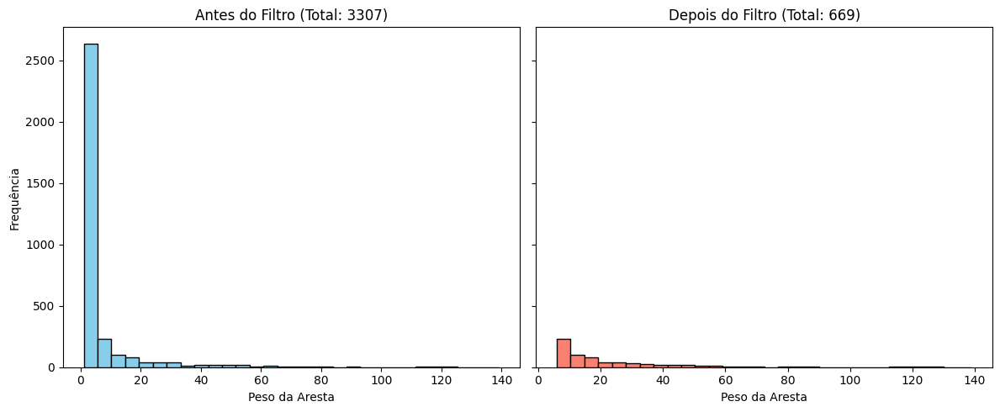

Removidas 2638 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_0_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_1_sentence_length.gexf


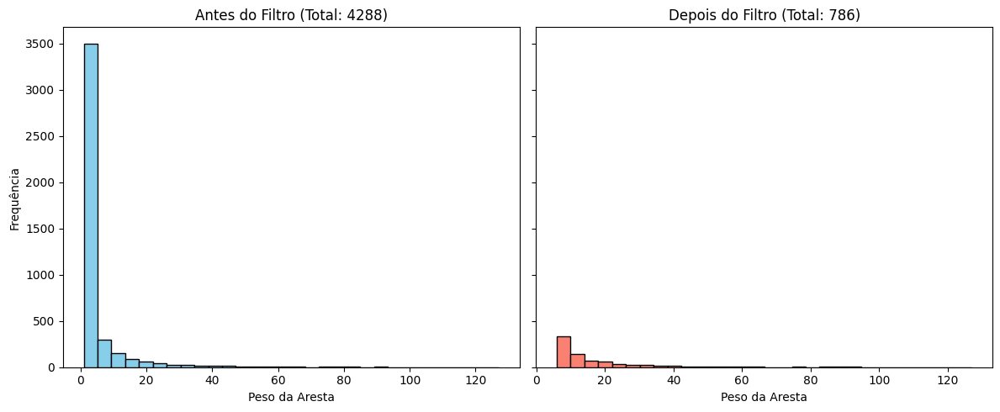

Removidas 3502 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_1_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_2_sentence_length.gexf


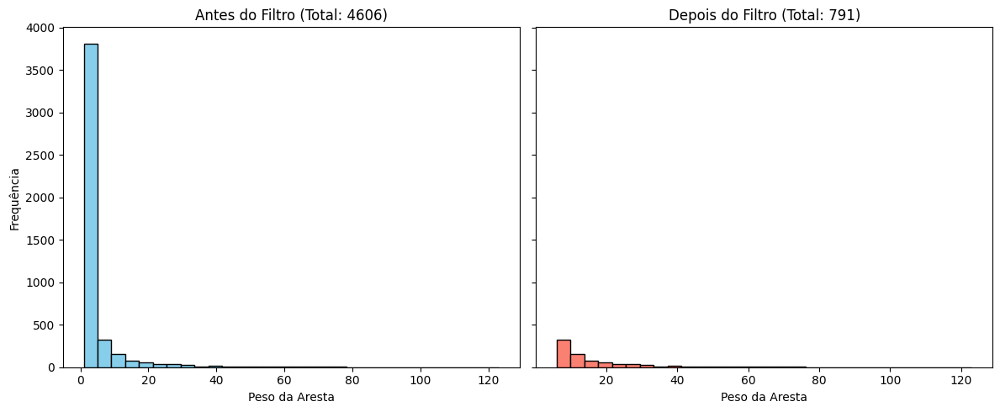

Removidas 3815 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_2_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_3_sentence_length.gexf


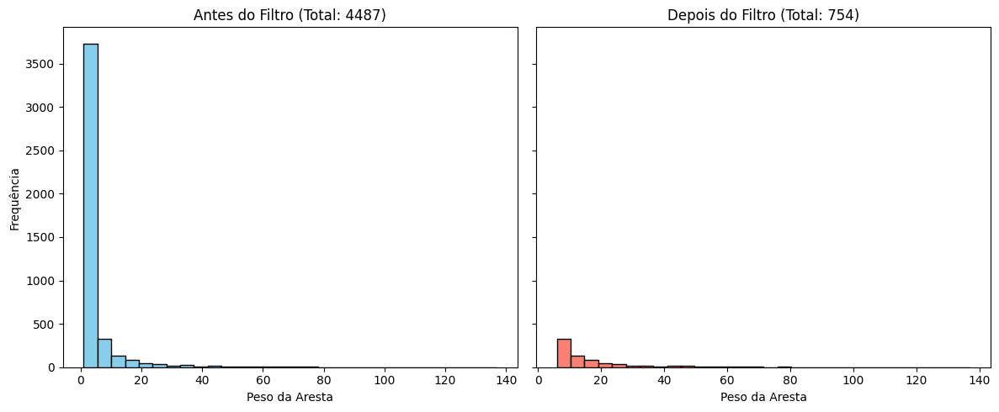

Removidas 3733 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_3_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_4_sentence_length.gexf


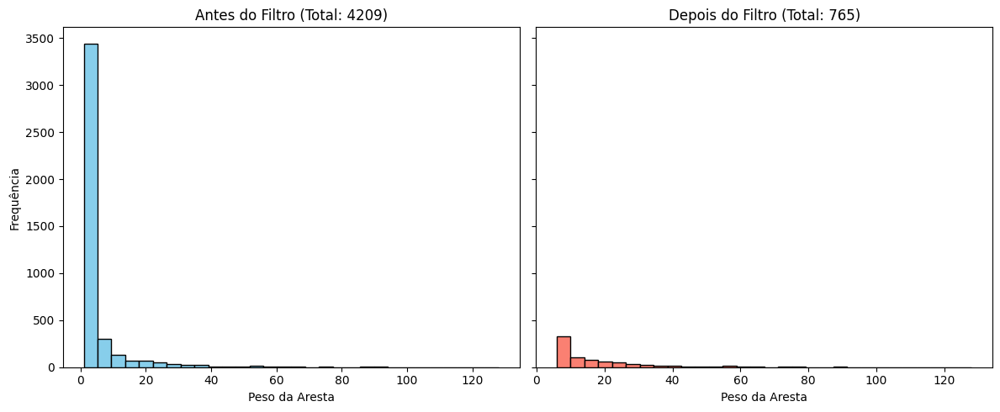

Removidas 3444 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_4_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_5_sentence_length.gexf


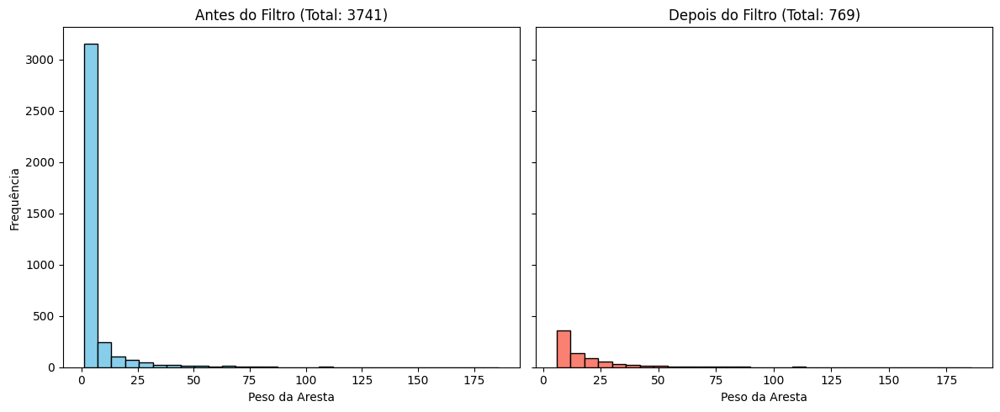

Removidas 2972 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_5_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_total_sentence_length.gexf


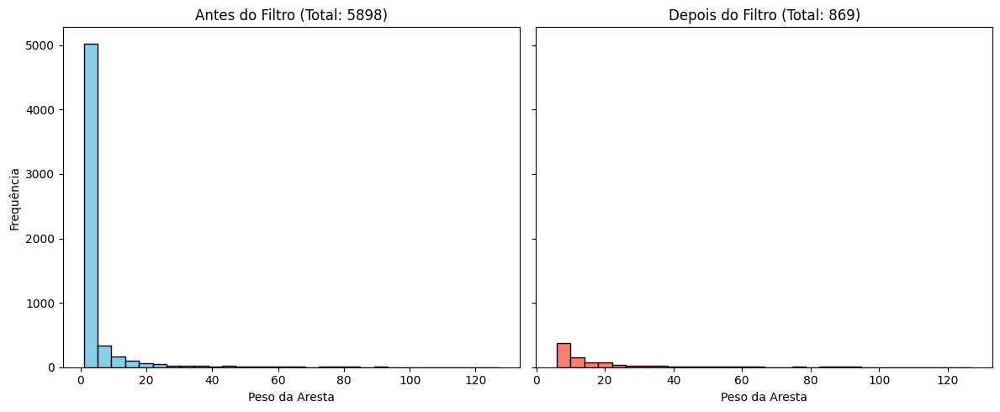

Removidas 5029 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_total_sentence_length.gexf


In [6]:
labels_dict = get_labels_dict()

# Filter the edges of the graphs based on the weight threshold before calculating the metrics
for dataset_name, labels in labels_dict.items():
  if dataset_name == "word_content": 
    print(f"skipping {dataset_name} - 1_000 labels found")
    continue
  for label in labels:

    filter_and_plot_edges(f"{GRAPH_PATH}complete/g_{label}_{dataset_name}.gexf", f"{GRAPH_PATH}filtered/g_{label}_{dataset_name}.gexf", threshold=5)

# Calculate the metrics for each filtered graph and save them in a csv file
for dataset_name in DATASETS_NAMES:
  for label in labels_dict[dataset_name]:
    metrics_per_layer = dict()
    
    for metric_name, metric_func in get_metric_function().items():
      current_graph = nx.read_gexf(f"{FILTERED_GRAPH_PATH}/g_{label}_{dataset_name}.gexf")

      metrics_per_layer[metric_name] = metric_func(current_graph)
    
    df_metrics = dict_to_dataframe(metrics_per_layer)
    df_metrics.to_csv(f'{PROCESSED_DATASET_PATH}/metrics_per_layer_{dataset_name}_{label}.csv', index=False)

# Show Metrics per Layer


📊 Processando dataset: subj_number


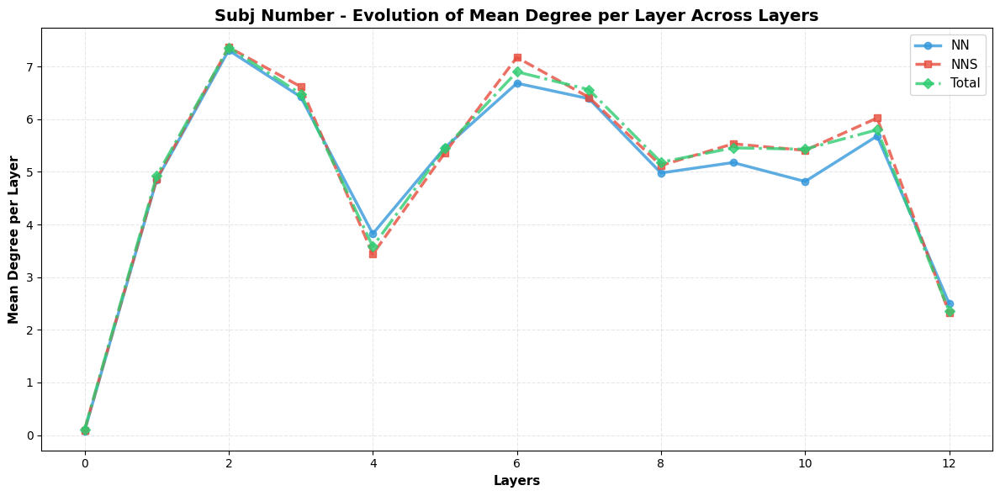

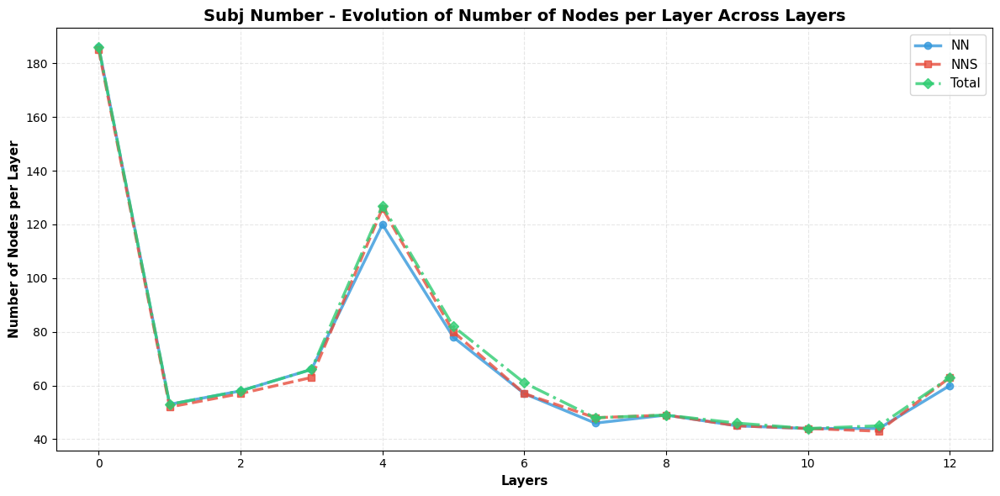

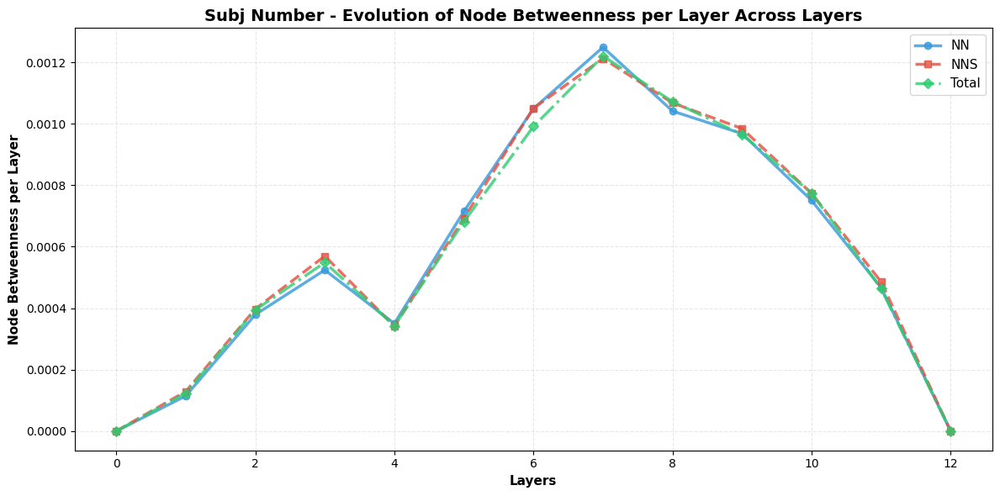

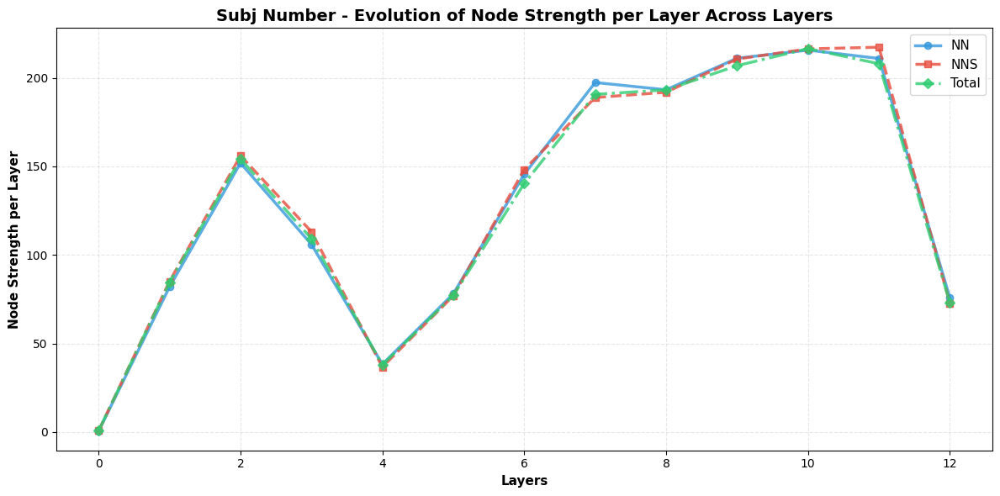

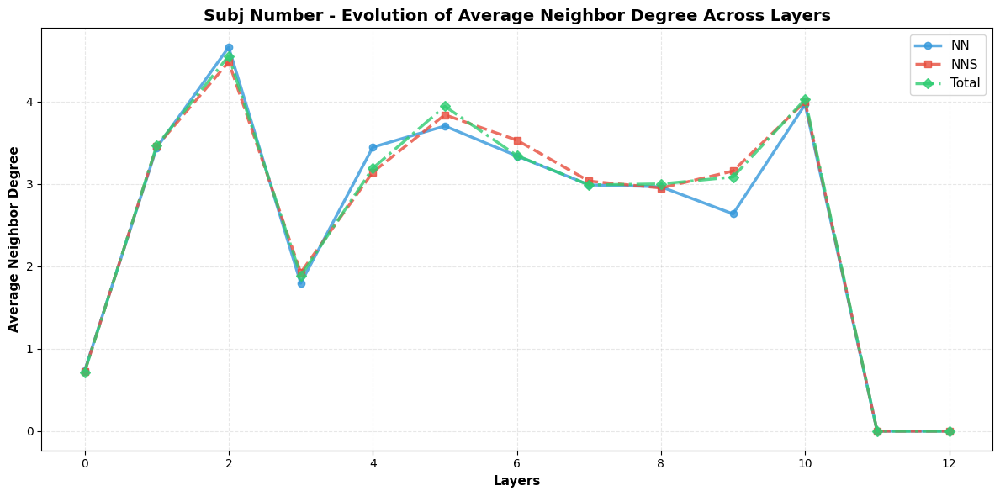

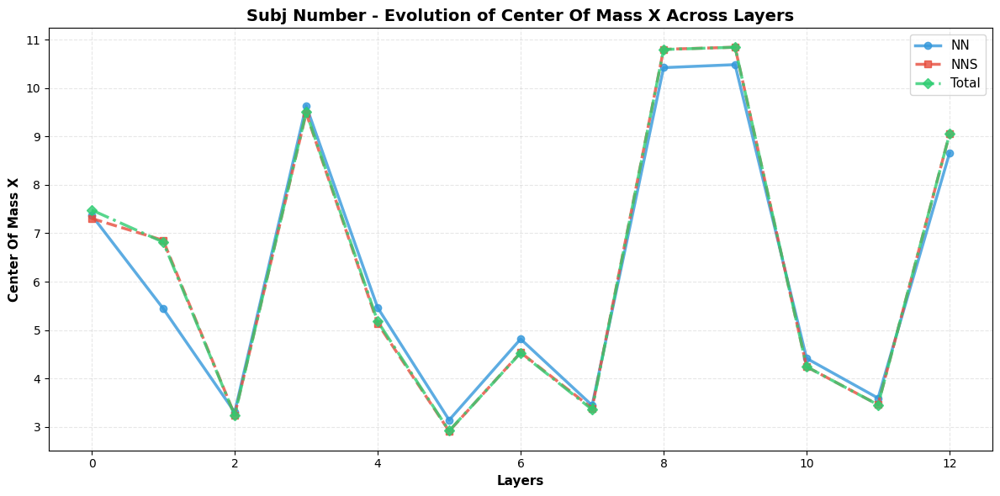

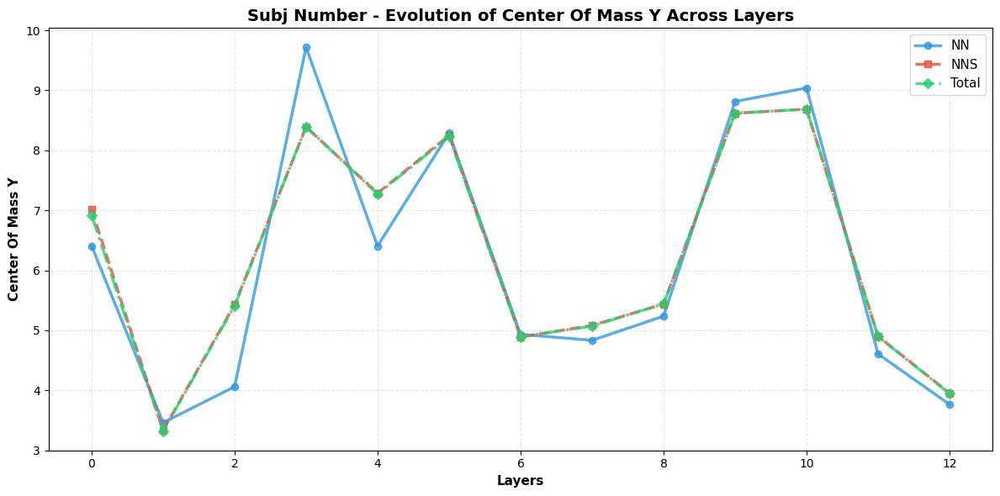

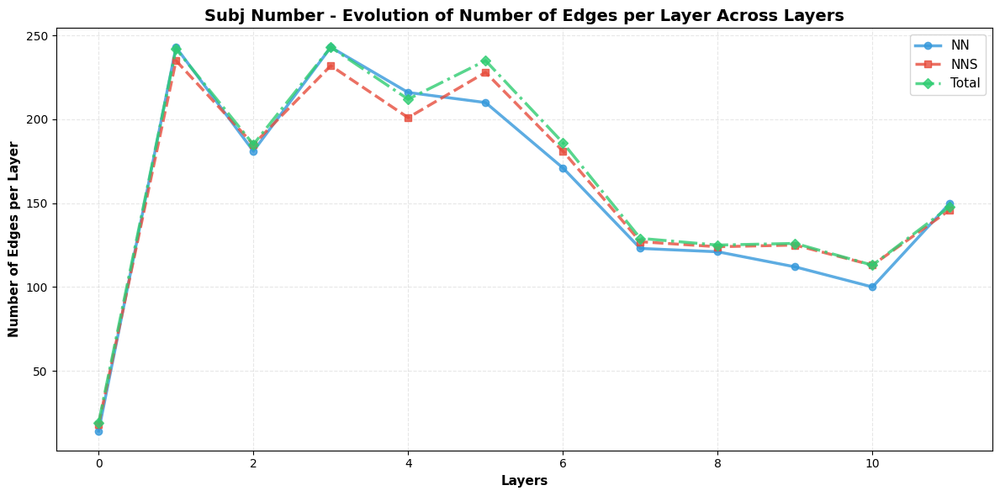

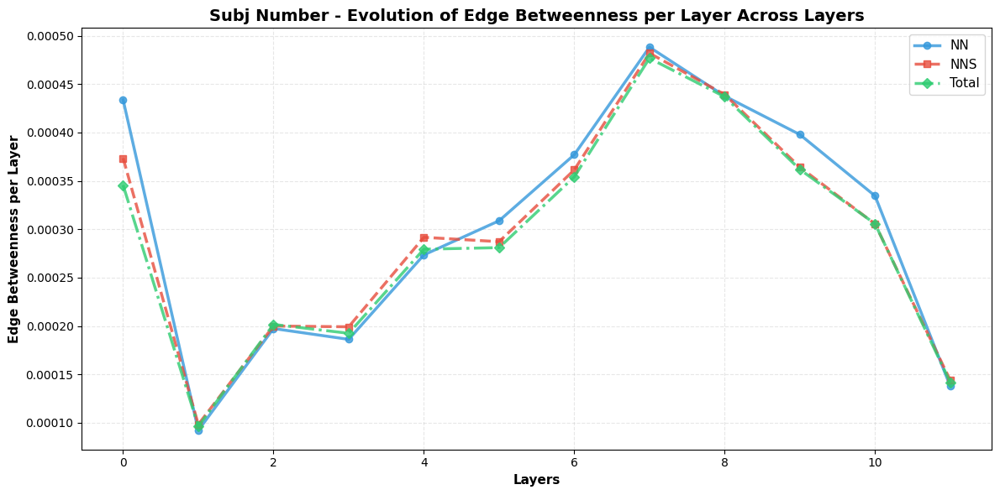


📊 Processando dataset: tree_depth


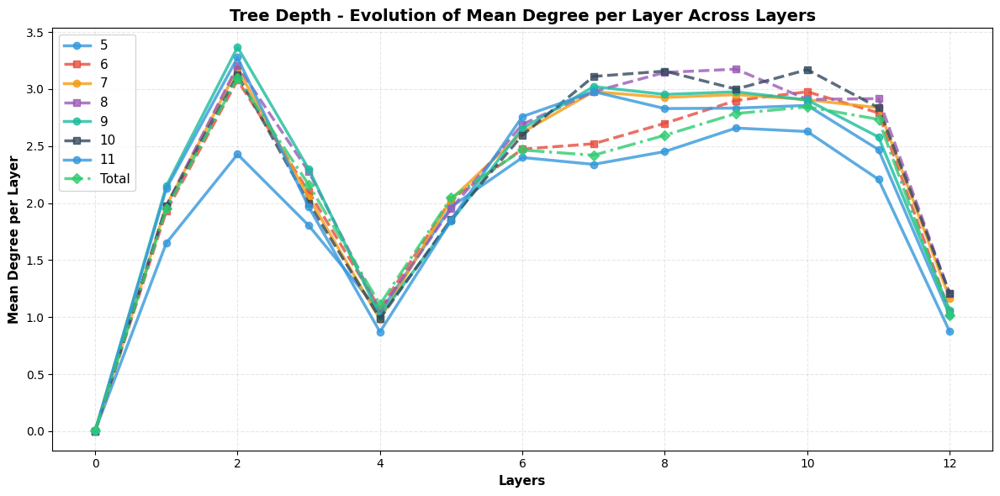

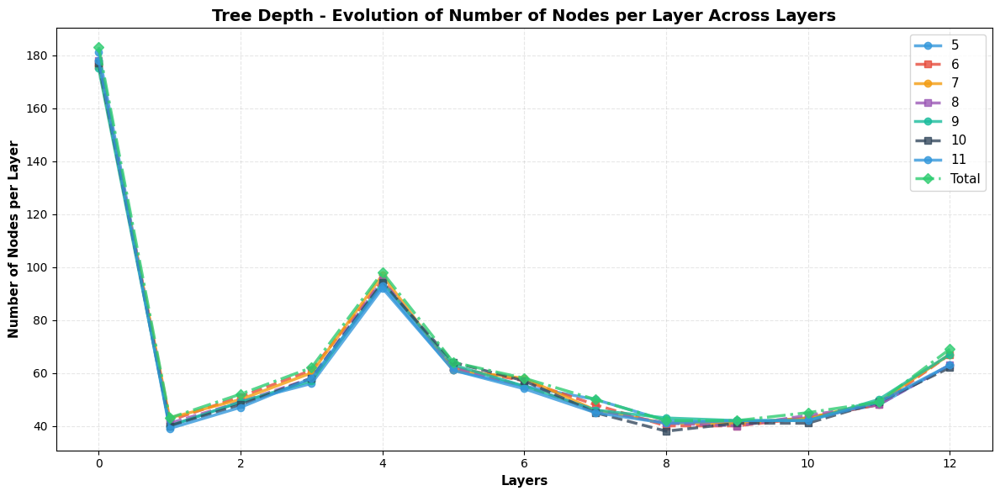

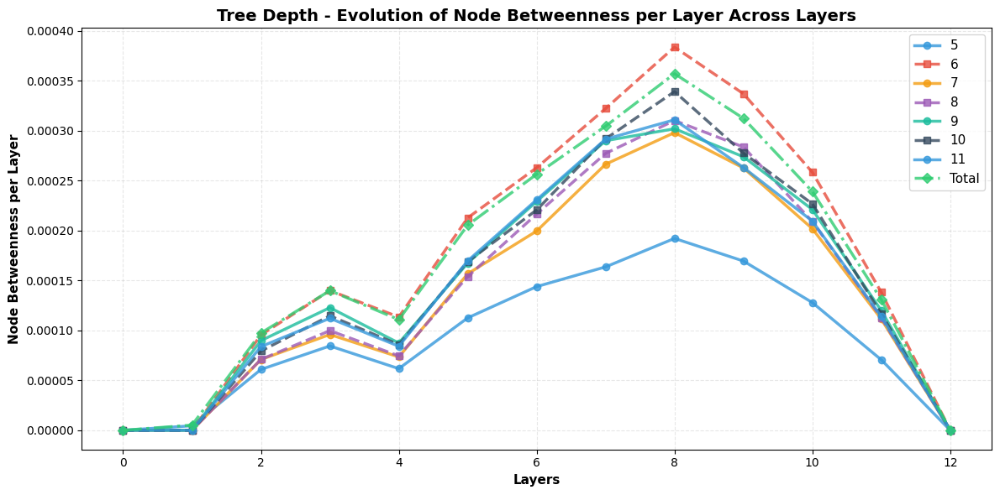

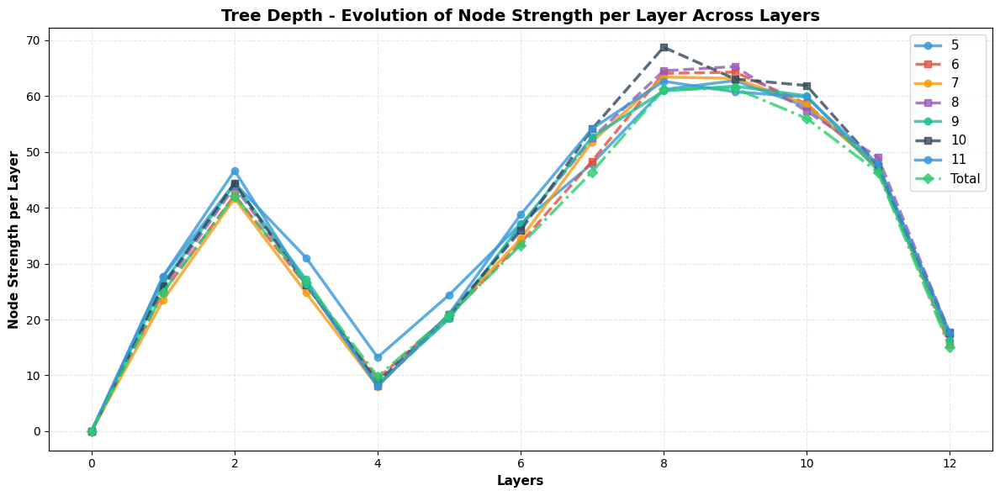

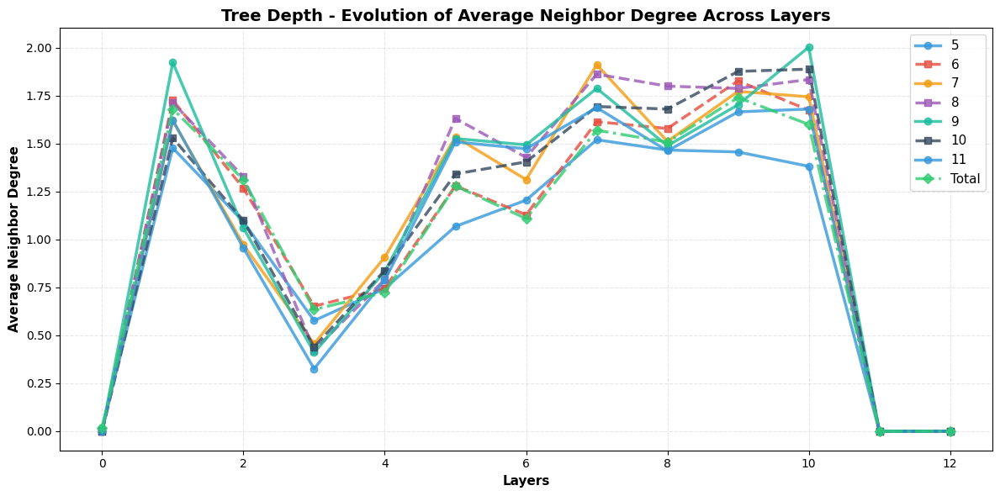

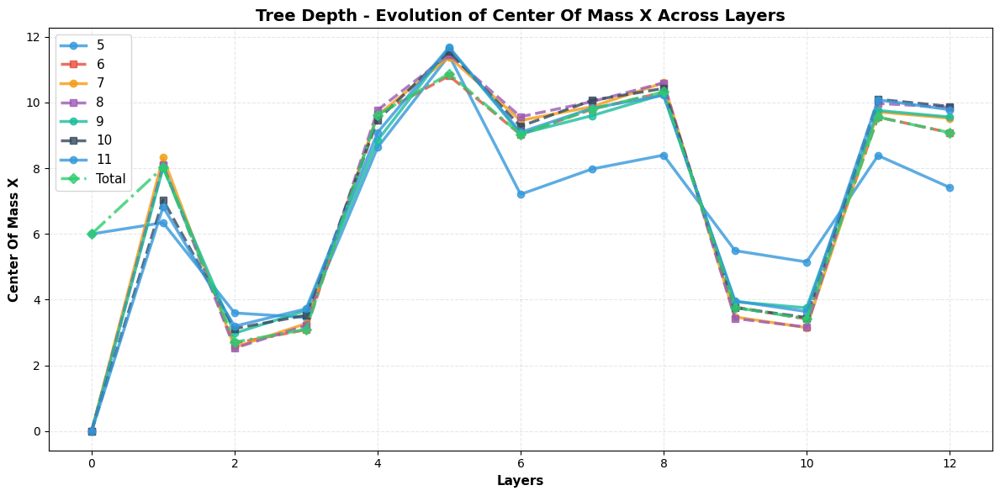

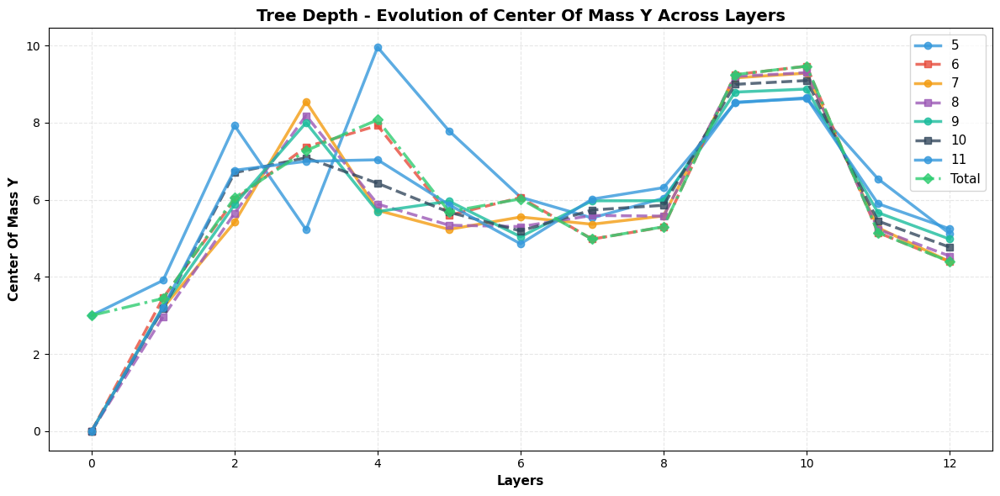

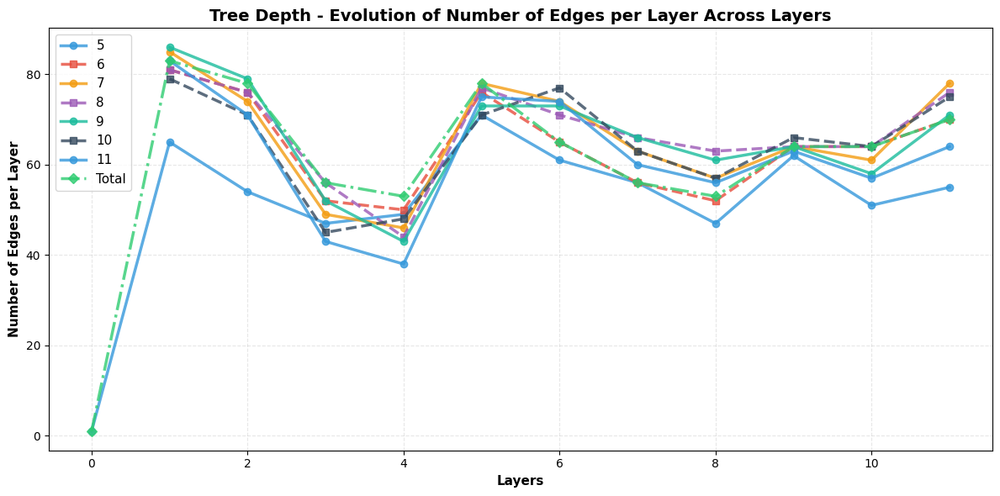

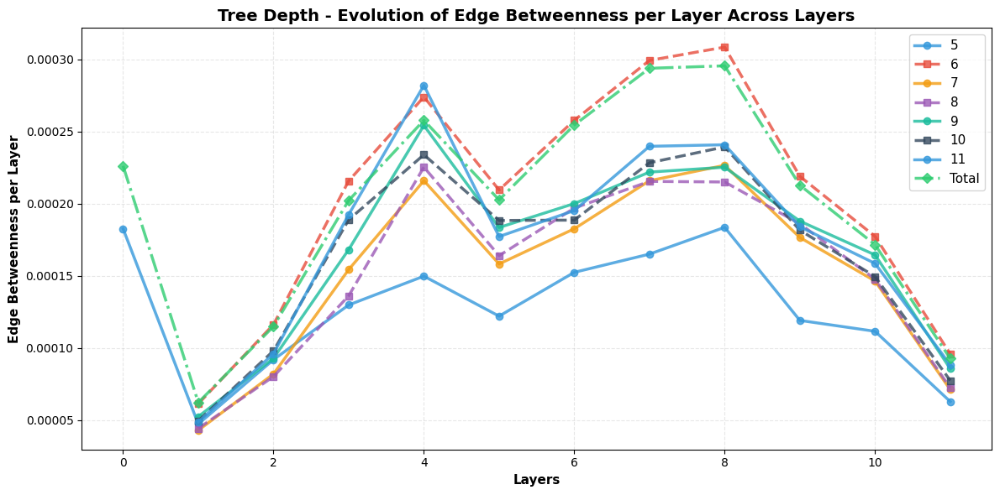


📊 Processando dataset: word_content
skipping word_content - 1_000 labels found

📊 Processando dataset: bigram_shift


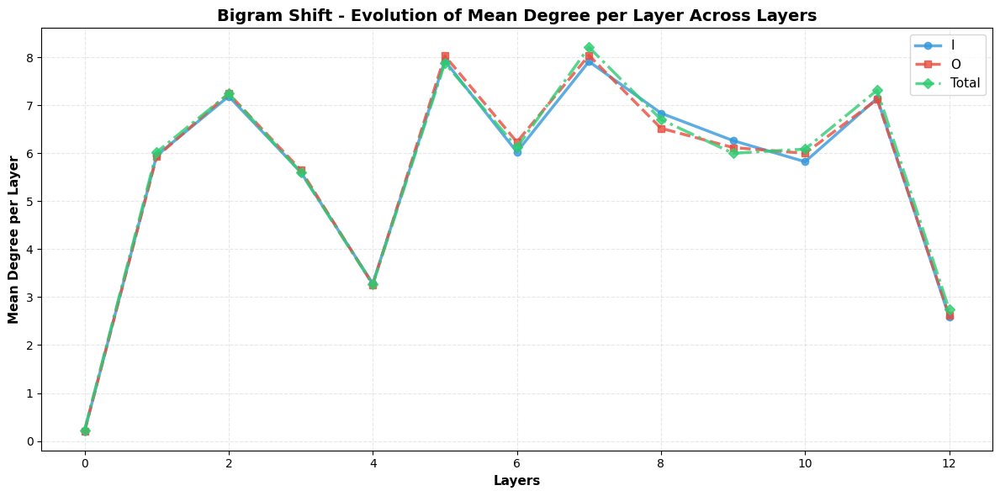

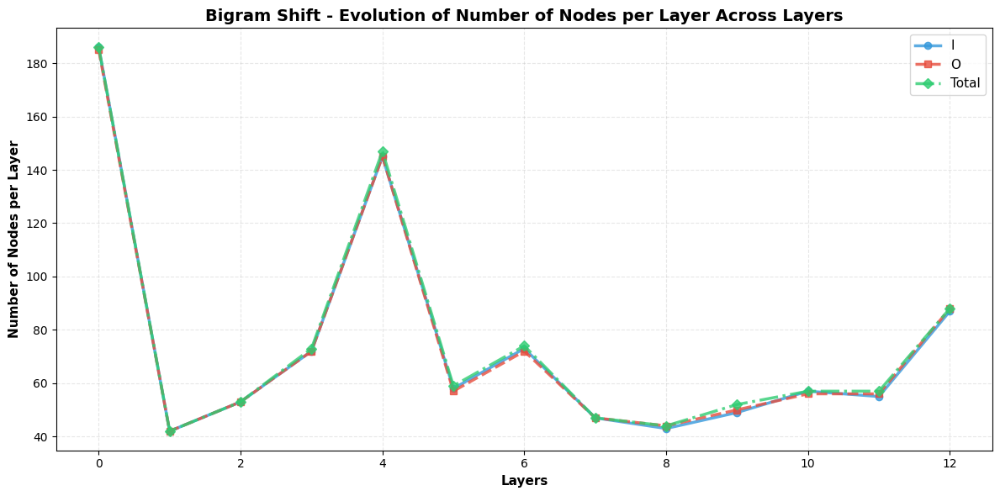

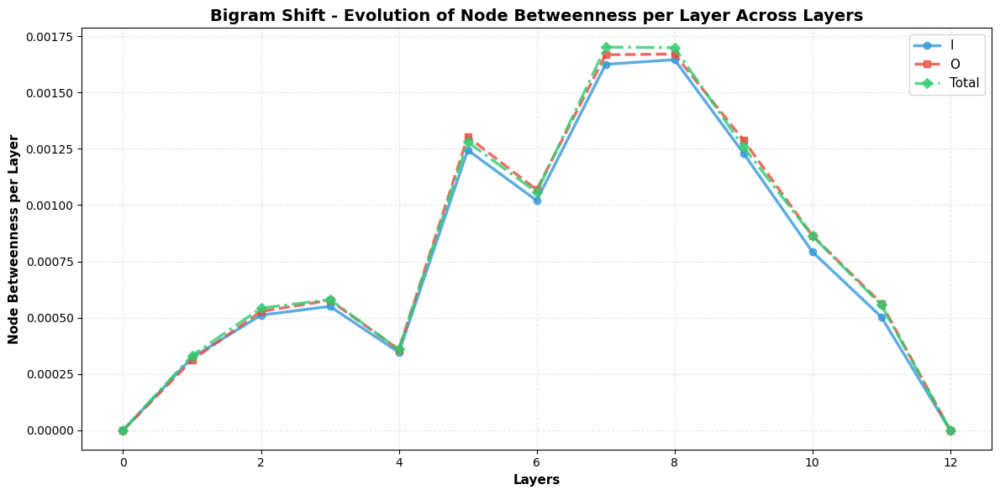

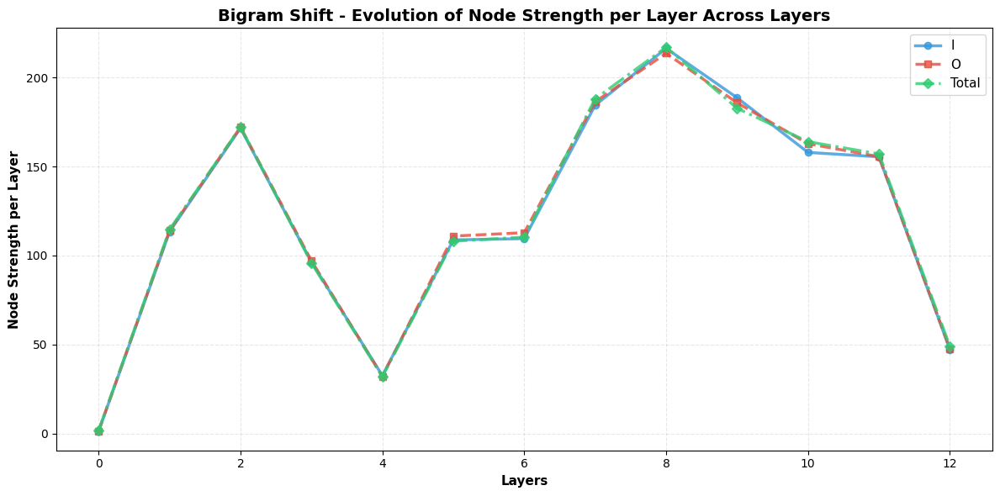

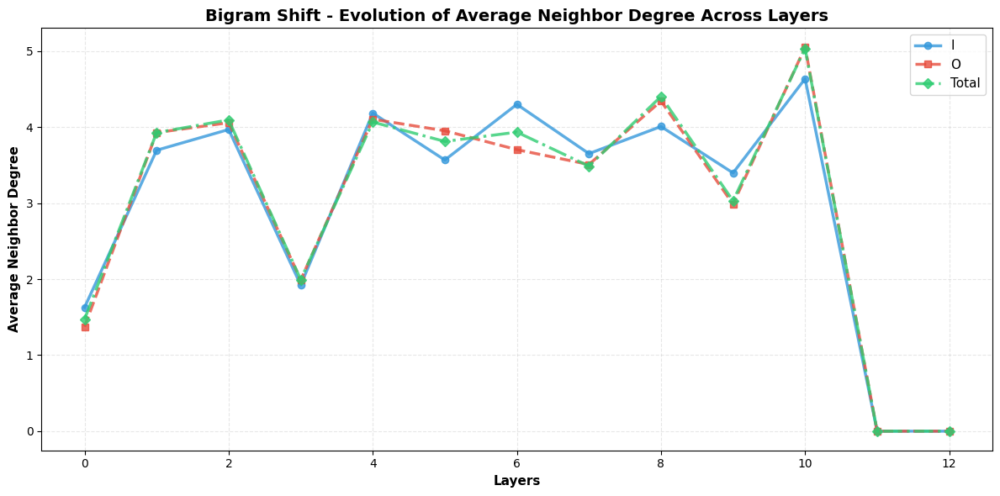

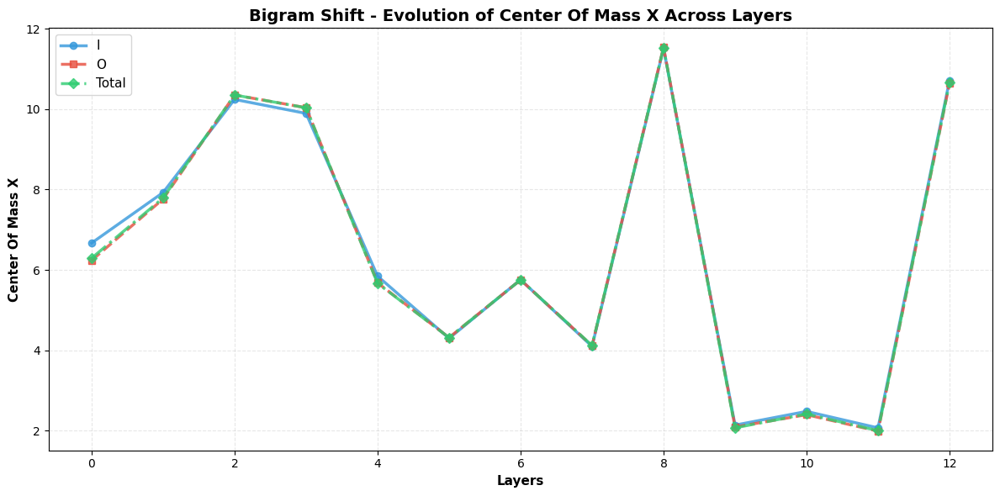

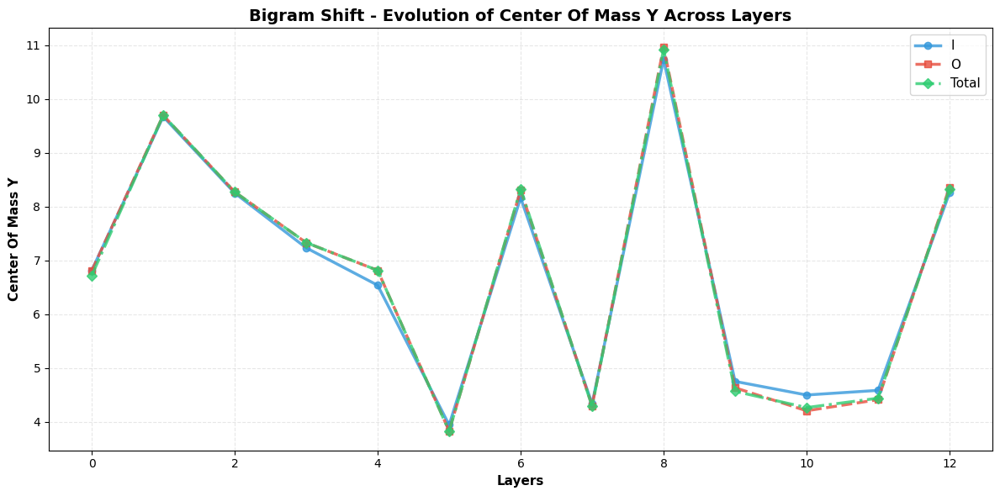

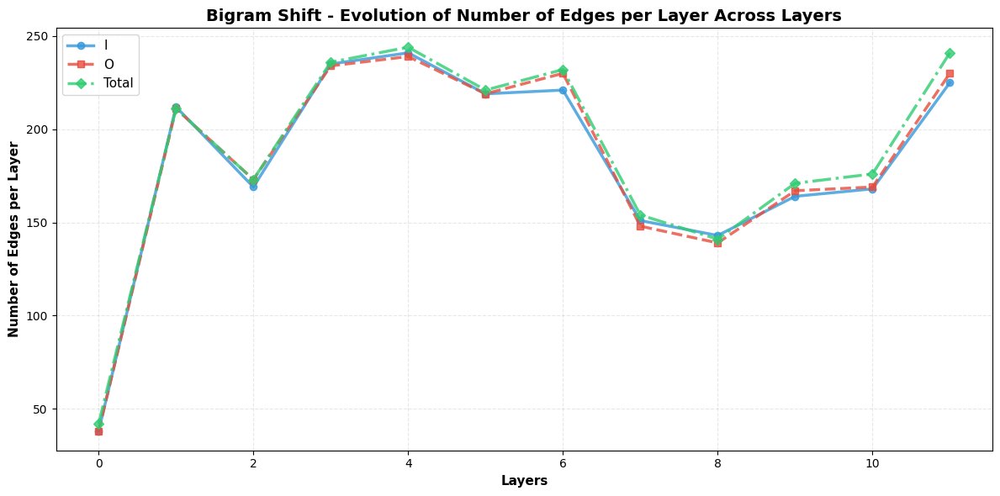

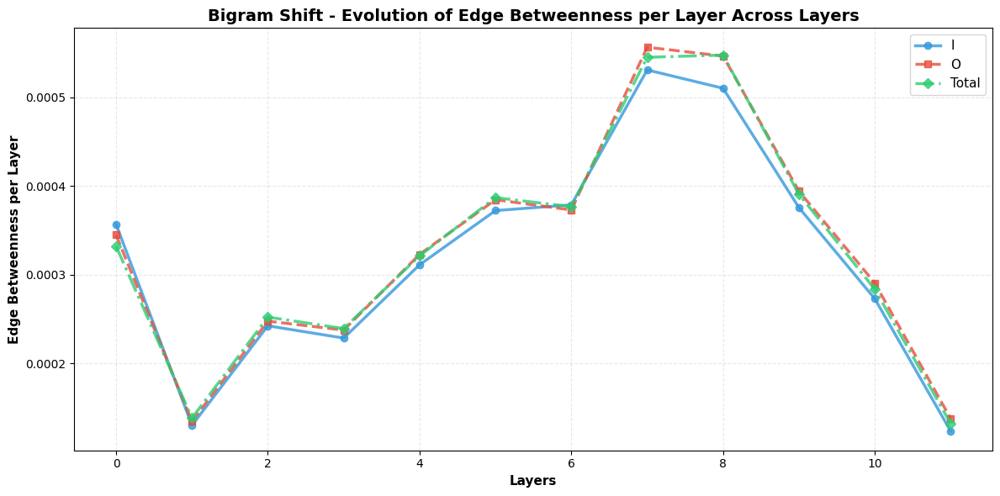


📊 Processando dataset: odd_man_out


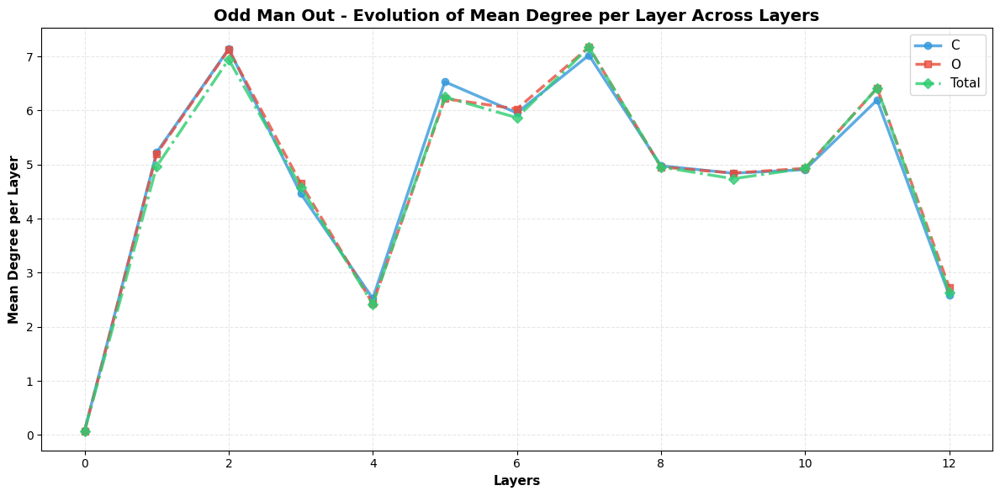

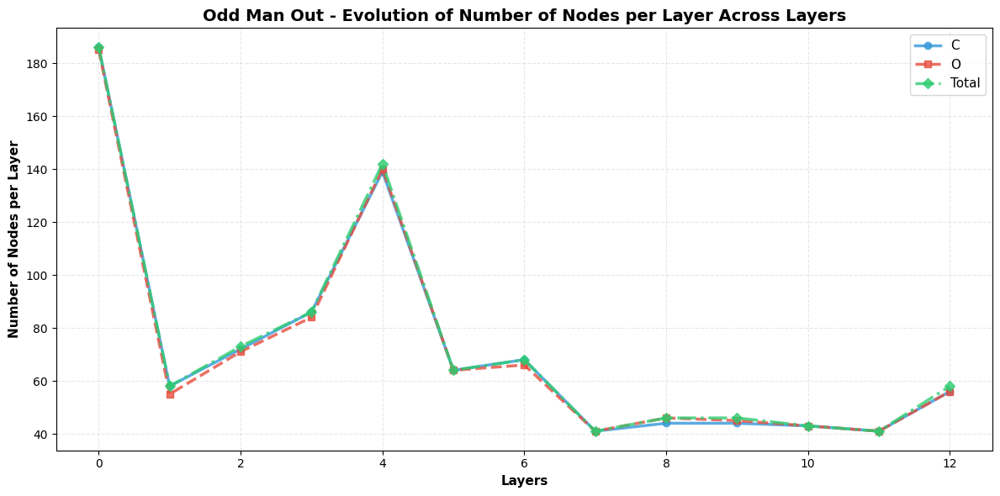

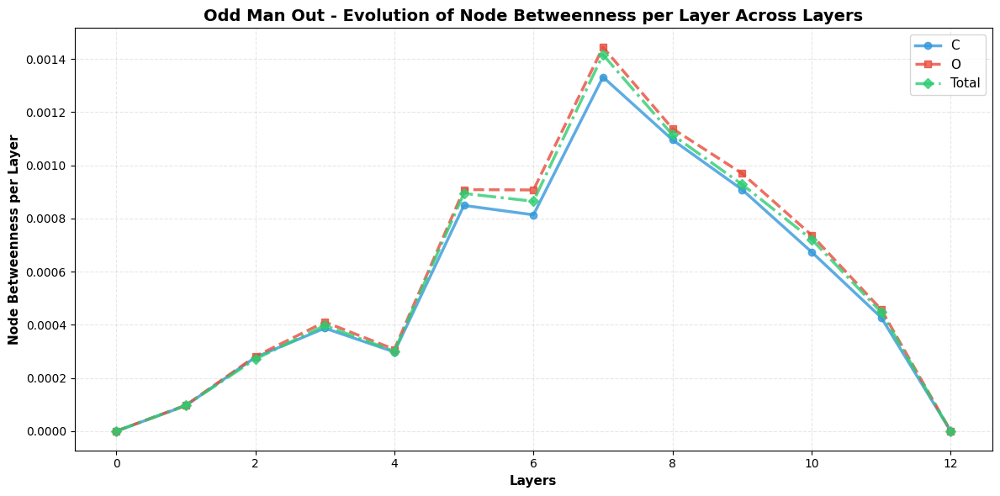

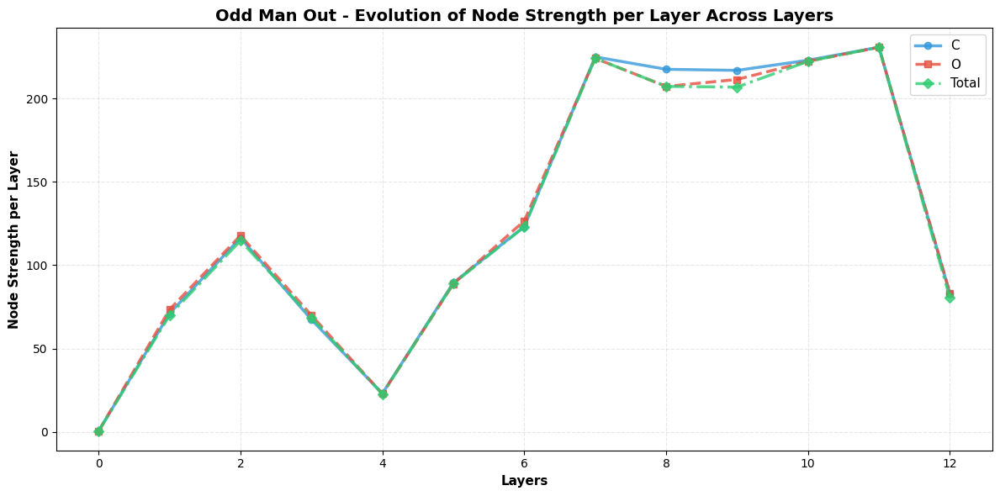

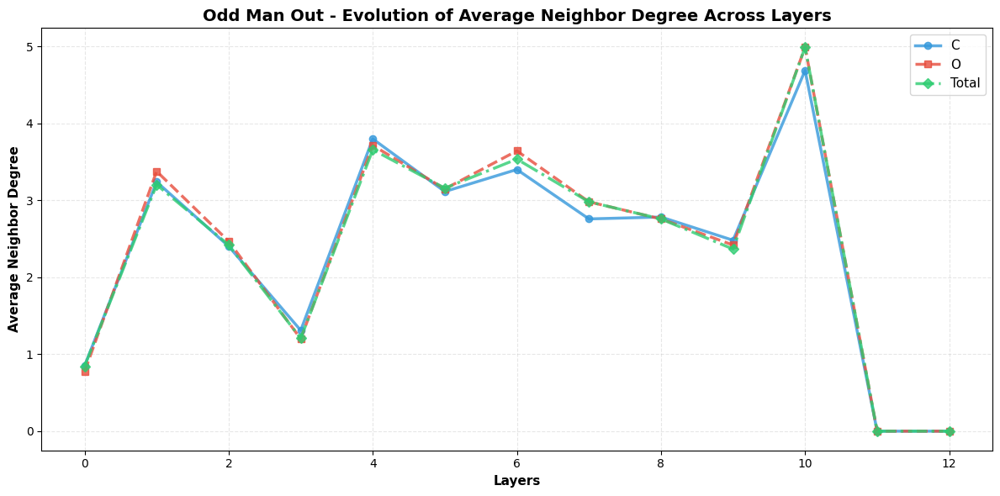

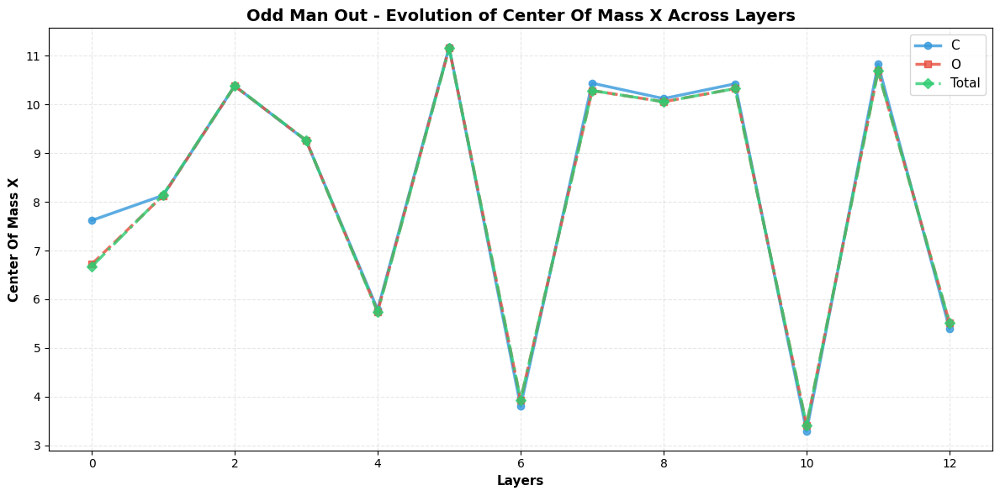

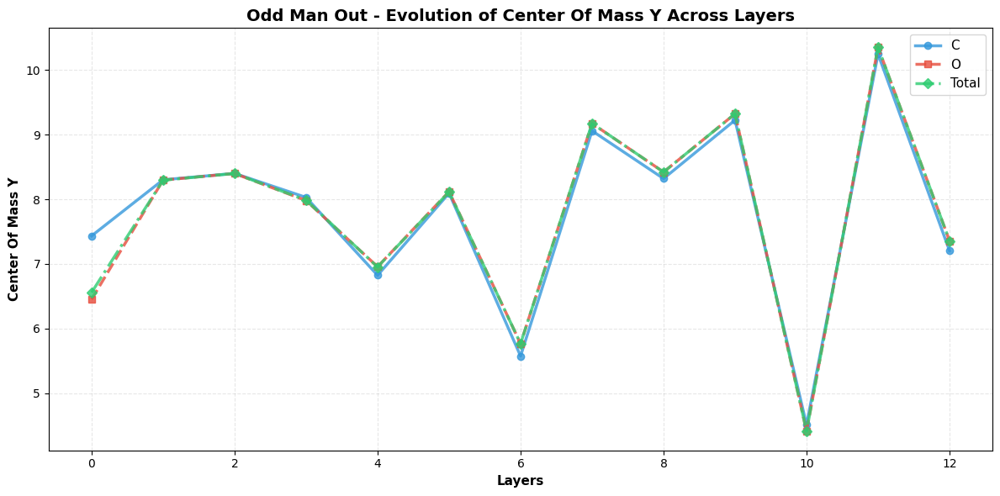

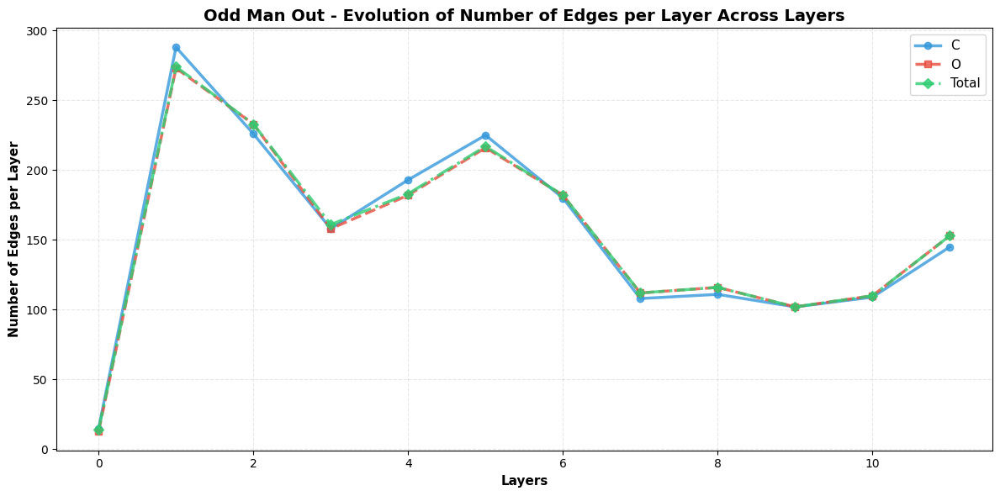

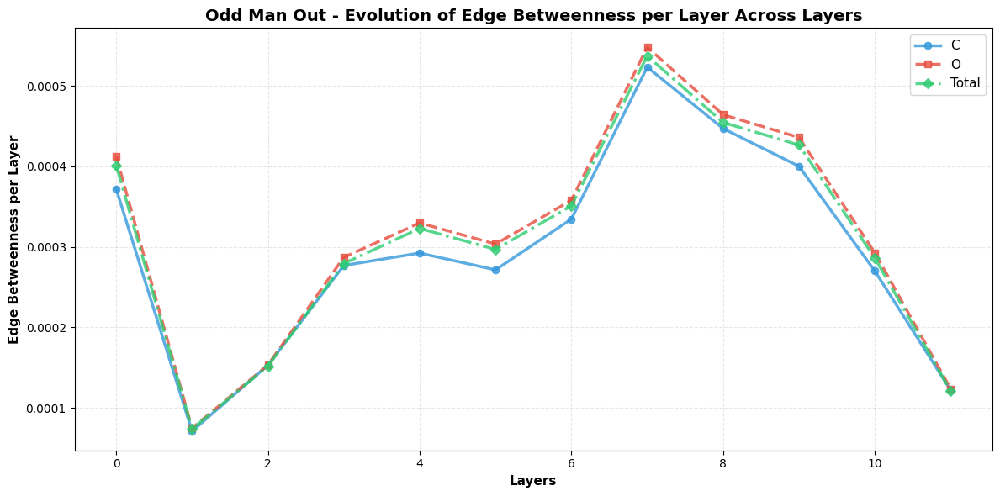


📊 Processando dataset: sentence_length


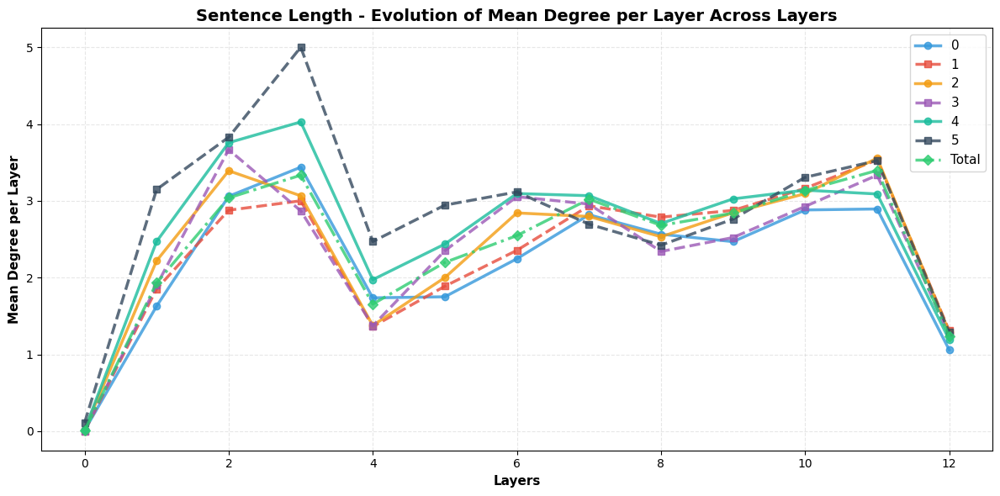

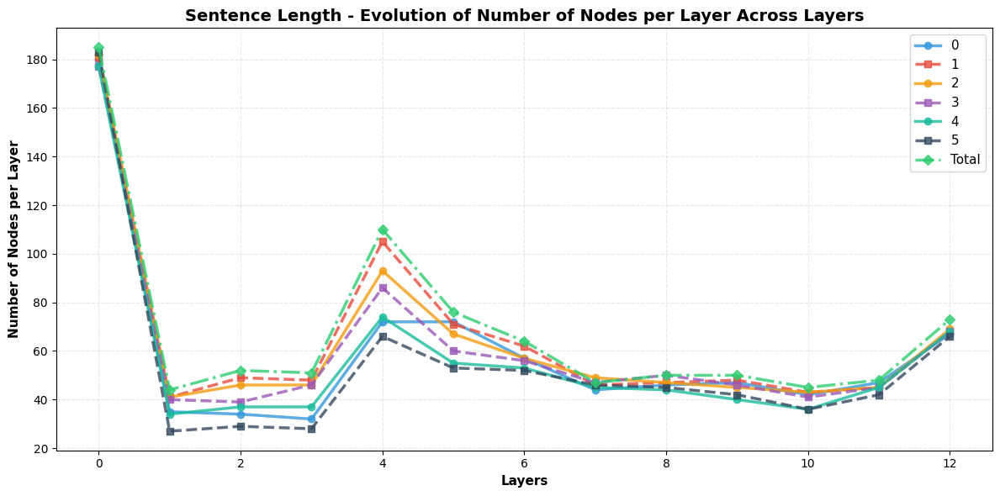

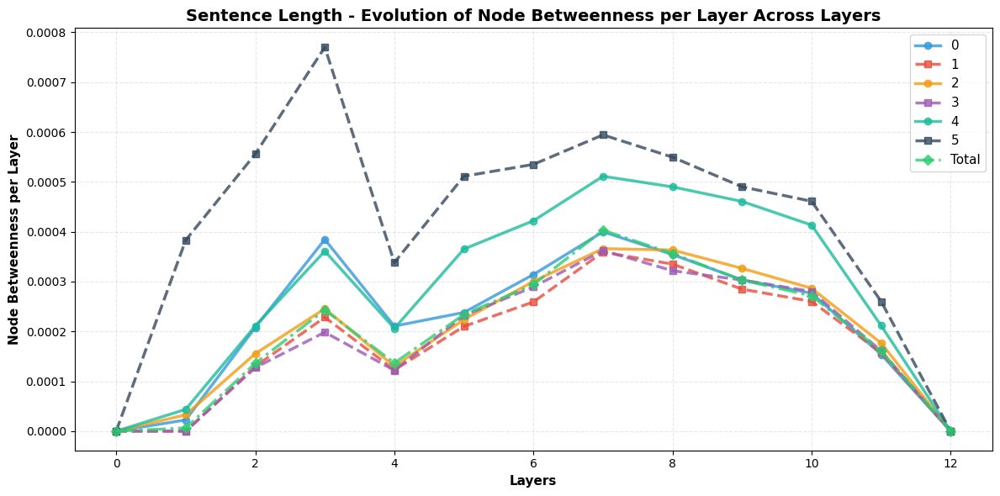

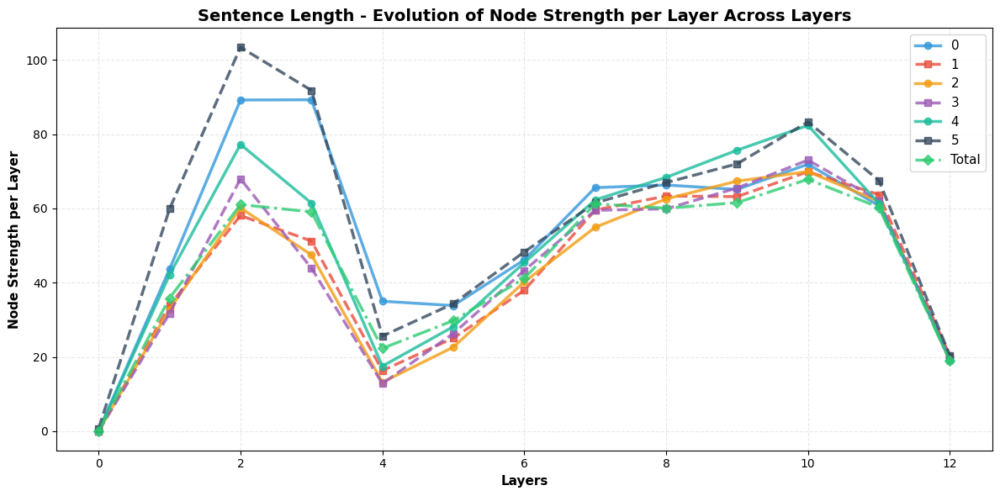

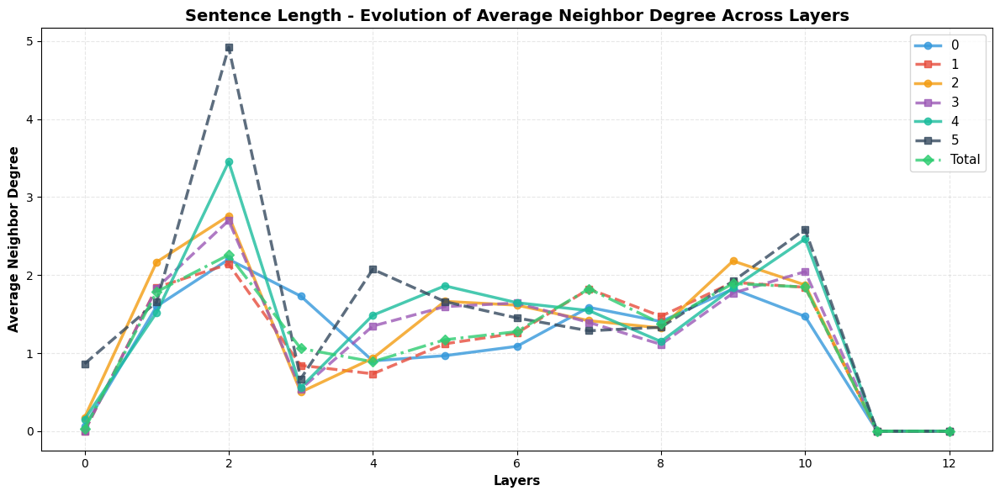

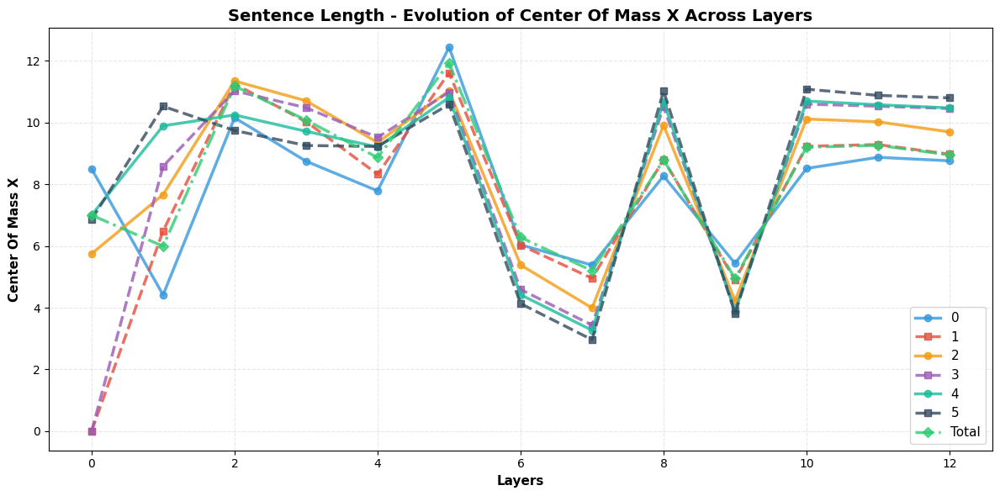

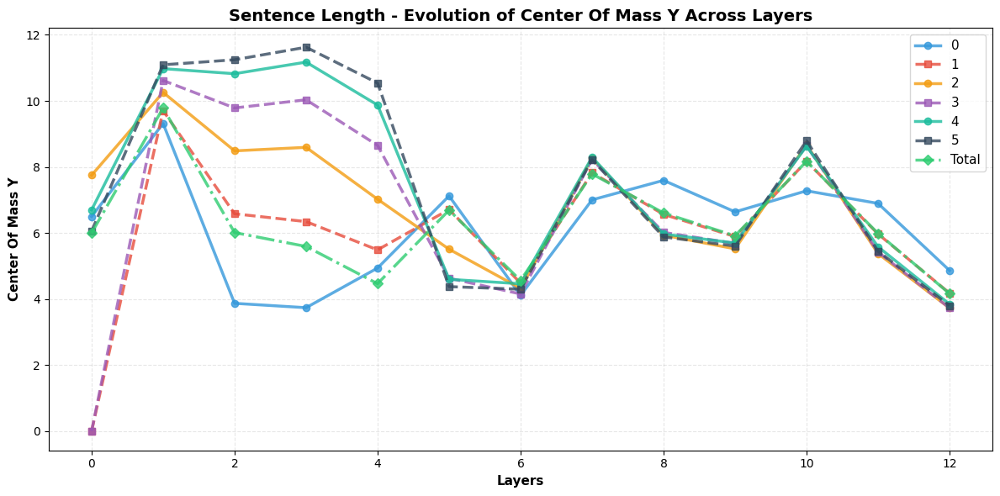

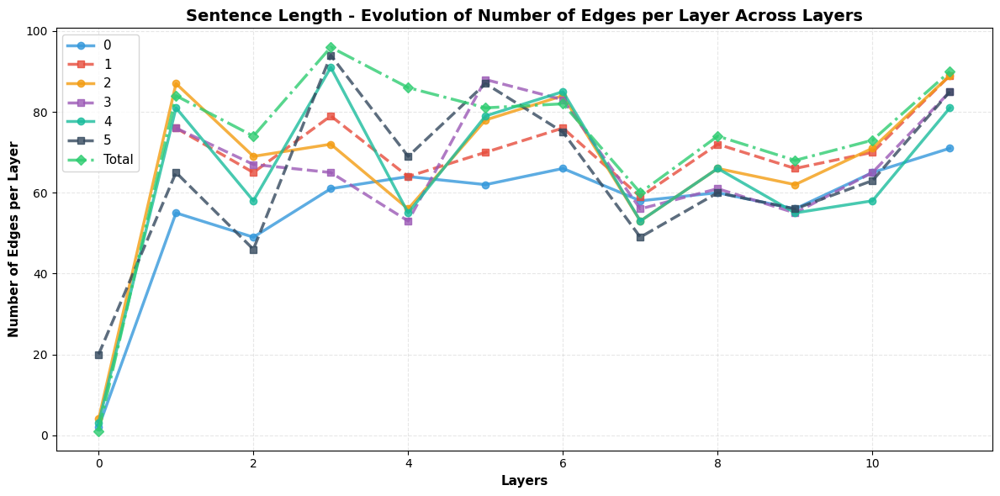

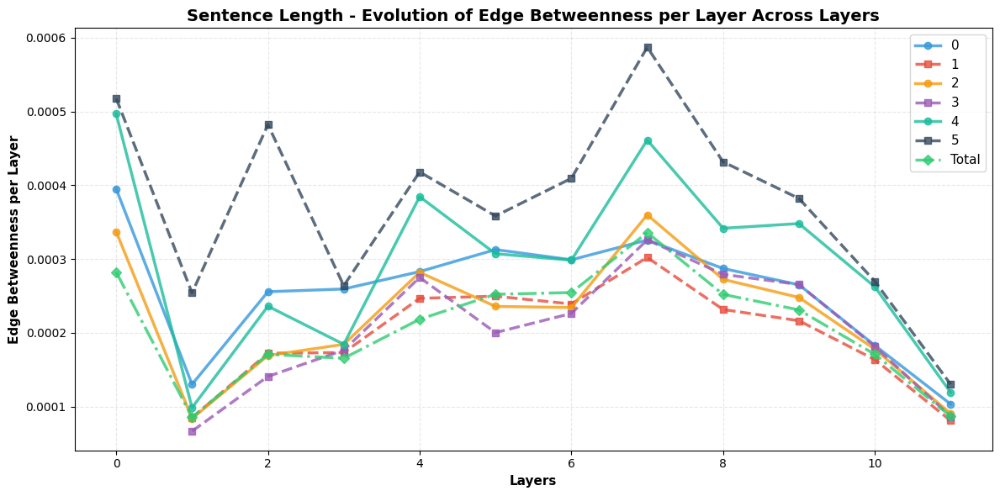

In [7]:
import os

def plot_csv_layer_evolution_generalized(dataset_name, labels_list, metric_name, base_path=PROCESSED_DATASET_PATH, ylabel=None):
    """
    Plota a evolução de uma métrica através das camadas para um dataset específico.
    
    Args:
        dataset_name: Nome do dataset (ex: 'bigram_shift', 'odd_man_out')
        labels_list: Lista de labels para o dataset (ex: ['I', 'O', 'total'])
        metric_name: Nome da métrica a plotar
        base_path: Caminho base dos arquivos CSV
        ylabel: Label customizado para o eixo Y (opcional)
    """
    plt.figure(figsize=(12, 6))
    
    # Cores automáticas baseadas no índice (exceto 'total' que sempre é verde)
    color_palette = ["#3498db", "#e74c3c", "#f39c12", "#9b59b6", "#1abc9c", "#34495e"]
    
    found_any_data = False
    
    for idx, label in enumerate(labels_list):
        file_path = f"{base_path}metrics_per_layer_{dataset_name}_{label}.csv"
        
        if os.path.exists(file_path):
            df_metrics = pd.read_csv(file_path)
            
            if metric_name in df_metrics.columns:
                # Definir cor e estilo
                if label == "total":
                    color = "#2ecc71"
                    linestyle = "-."
                    marker = "D"
                    style_label = "Total"
                else:
                    color = color_palette[idx % len(color_palette)]
                    linestyle = "-" if idx % 2 == 0 else "--"
                    marker = "o" if idx % 2 == 0 else "s"
                    style_label = label
                
                plt.plot(
                    df_metrics['layer'],
                    df_metrics[metric_name],
                    label=style_label,
                    color=color,
                    linestyle=linestyle,
                    linewidth=2.5,
                    marker=marker,
                    markersize=6,
                    alpha=0.8
                )
                found_any_data = True
        else:
            print(f"⚠ Arquivo não encontrado: {file_path}")
    
    if not found_any_data:
        plt.close()
        print(f"❌ Nenhum arquivo encontrado para o dataset: {dataset_name}")
        return

    # Configurações de labels e título
    if ylabel is None:
        ylabel = metric_name.replace('_', ' ').title()
    
    plt.title(f"{dataset_name.replace('_', ' ').title()} - Evolution of {ylabel} Across Layers", 
              fontsize=14, fontweight='bold')
    plt.xlabel("Layers", fontweight='bold', fontsize=11)
    plt.ylabel(ylabel, fontweight='bold', fontsize=11)
    plt.legend(fontsize=11, loc='best')
    plt.grid(alpha=0.3, linestyle='--')
    plt.tight_layout()
    plt.show()


# ===== Exemplo de uso =====
labels = get_labels_dict()
metric_labels = {
    "num_nodes_per_layer": "Number of Nodes per Layer",
    "edge_num_edges_per_layer": "Number of Edges per Layer",
    "degree_per_layer": "Mean Degree per Layer",
    "node_betweenness_per_layer": "Node Betweenness per Layer",
    "node_strength_per_layer": "Node Strength per Layer",
    "average_neighbor_degree": "Average Neighbor Degree",
    "edge_edge_betweenness_per_layer": "Edge Betweenness per Layer"
}

# Plotar para todos os datasets
for dataset_name, labels_list in labels.items():
    print(f"\n📊 Processando dataset: {dataset_name}")
    
    if dataset_name == "word_content": 
      print(f"skipping {dataset_name} - 1_000 labels found")
      continue
    
    # Detectar métricas disponíveis
    sample_file = f"{PROCESSED_DATASET_PATH}/metrics_per_layer_{dataset_name}_{labels_list[0]}.csv"
    if os.path.exists(sample_file):
        df_sample = pd.read_csv(sample_file)
        metrics_to_plot = [col for col in df_sample.columns if col not in ['layer', 'layer_description']]
        
        for metric_name in metrics_to_plot:
            ylabel = metric_labels.get(metric_name, metric_name.replace('_', ' ').title())
            plot_csv_layer_evolution_generalized(dataset_name, labels_list, metric_name, ylabel=ylabel)

# Probing using Features

Investiga a relação entre a topologia da informação e a capacidade de representação do modelo.  
A abordagem clássica de probing verifica apenas se uma determinada camada possui a informação necessária para resolver uma tarefa.  

* O classificado determina se quais camadas estão mais aptas a resolver um determinado problema, se certas metricas acompanham essa curva, podesse usa-las para entender como a topologia dos NRAGs conversa com a distribuição de conhecimento no modelo.

In [8]:
import json
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

for dataset_name in DATASETS_NAMES:
    print("====================================================")
    print(f"Carregando rótulos do dataset: {dataset_name}")
    print("====================================================")

    # 1. Carregar apenas os Rótulos do bigram_shift.txt (ignorando os splits antigos)
    labels = []

    with open(f"{RAW_DATASET_PATH}/{dataset_name}.txt", "r", encoding="utf-8") as f:
        for line in f:
            parts = line.strip().split("\t")
            if len(parts) >= 3:
                labels.append(parts[1])

    y = np.array(labels)

    # 2. Carregar as Ativações do JSONL gerado pelo ActivationAreas
    activations_per_layer = {} 

    with open(f"{INTERIM_DATASET_PATH}/{dataset_name}_features.json", "r", encoding="utf-8") as f:
        for line_idx, line in enumerate(f):
            data = json.loads(line)
            
            layers_data = data["features"][0]["layers"]
            
            for layer in layers_data:
                layer_idx = layer["index"]
                layer_values = layer["values"]
                
                if layer_idx not in activations_per_layer:
                    activations_per_layer[layer_idx] = []
                    
                activations_per_layer[layer_idx].append(layer_values)

    # 3. Criar novos splits e treinar o Probe para CADA camada
    print("Resultados do Probing (Acurácia por Camada com Novo Split):")
    print("-" * 55)

    # O random_state garante que o split seja reprodutível em futuras execuções
    # O stratify=y garante que a proporção de classes se mantenha no treino e teste
    results_list = []

    for layer_idx in sorted(activations_per_layer.keys()):
        X = np.array(activations_per_layer[layer_idx])
        
        # Criando um novo split: 80% para treino do probe, 20% para teste
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.20, random_state=42, stratify=y
        )
        
        # Treinando o Linear Probe
        probe = LogisticRegression(max_iter=1000, class_weight='balanced')
        probe.fit(X_train, y_train)
        
        # Avaliando
        predictions = probe.predict(X_test)
        acc = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions, average='weighted', zero_division=0)
        recall = recall_score(y_test, predictions, average='weighted', zero_division=0)
        f1 = f1_score(y_test, predictions, average='weighted', zero_division=0)
        
        # Armazenar resultados para DataFrame
        results_list.append({
            'layer': layer_idx,
            'accuracy': acc,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'n_train_samples': len(y_train),
            'n_test_samples': len(y_test),
            'n_features': X.shape[1]
        })
        
        print(f"Camada {layer_idx:02d}: Acurácia de {acc * 100:.2f}%")

    # 4. Criar DataFrame com os resultados
    df_probing_results = pd.DataFrame(results_list)

    # 5. Salvar DataFrame em CSV
    output_path = f'{PROCESSED_DATASET_PATH}/probing_{dataset_name}_results.csv'
    df_probing_results.to_csv(output_path, index=False)
    print(f"\n✓ Resultados salvos em: {output_path}")

    # 6. Exibir resumo estatístico
    print("\n" + "="*55)
    print("Resumo Estatístico dos Resultados:")
    print("="*55)
    print(df_probing_results[['layer', 'accuracy', 'precision', 'recall', 'f1_score']].describe())

    # 7. Exibir o DataFrame completo
    print("\n" + "="*55)
    print("Tabela Completa de Resultados:")
    print("="*55)
    display(df_probing_results)


    # ================================================
    #  plot probing results
    # ================================================

    # 1. Garantir que as camadas estejam em ordem crescente
    df_plot = df_probing_results.sort_values(by='layer')

    # 2. Definir a coluna 'layer' como índice para facilitar o plot de múltiplas colunas
    df_plot = df_plot.set_index('layer')

    # 3. Criar o gráfico
    plt.figure(figsize=(12, 6))

    # O pandas automaticamente cria uma linha para cada coluna numérica restante
    df_plot_filtered = df_plot.drop(columns=[col for col in df_plot.columns if col.startswith('n_')])
    df_plot_filtered.plot(marker='o')

    # 4. Customização
    plt.title('Comparação de Métricas por Camada', fontsize=14)
    plt.xlabel('Camada (Layer)', fontsize=12)
    plt.ylabel('Valor da Métrica', fontsize=12)
    plt.xticks(df_plot.index) # Garante que cada camada tenha seu rótulo no eixo X
    plt.legend(title='Métricas', bbox_to_anchor=(1.05, 1), loc='upper left') # Legenda fora do gráfico
    plt.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout() # Ajusta o layout para a legenda não ser cortada
    plt.show()


    # ================================================
    #  confusion_matrix
    # ================================================


    cm = confusion_matrix(y_test, predictions)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Original (0)', 'Invertido (1)'], 
                yticklabels=['Original (0)', 'Invertido (1)'])

    plt.title(f'Matriz de Confusão - Camada {layer_idx}', fontsize=15)
    plt.ylabel('Realidade (Ground Truth)')
    plt.xlabel('Previsão do Probe')
    plt.show()

Carregando rótulos do dataset: subj_number


KeyboardInterrupt: 

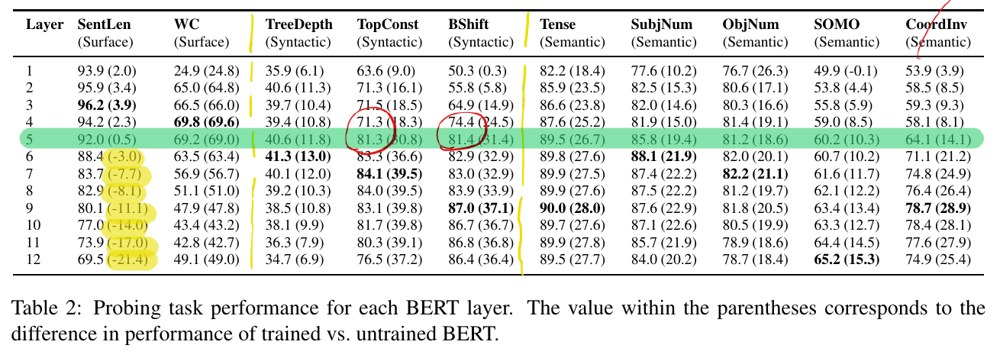
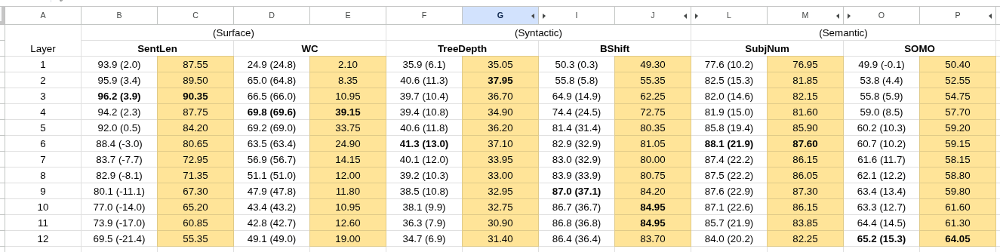

TASK TYPE: surface
Carregando rótulos do dataset: sentence_length


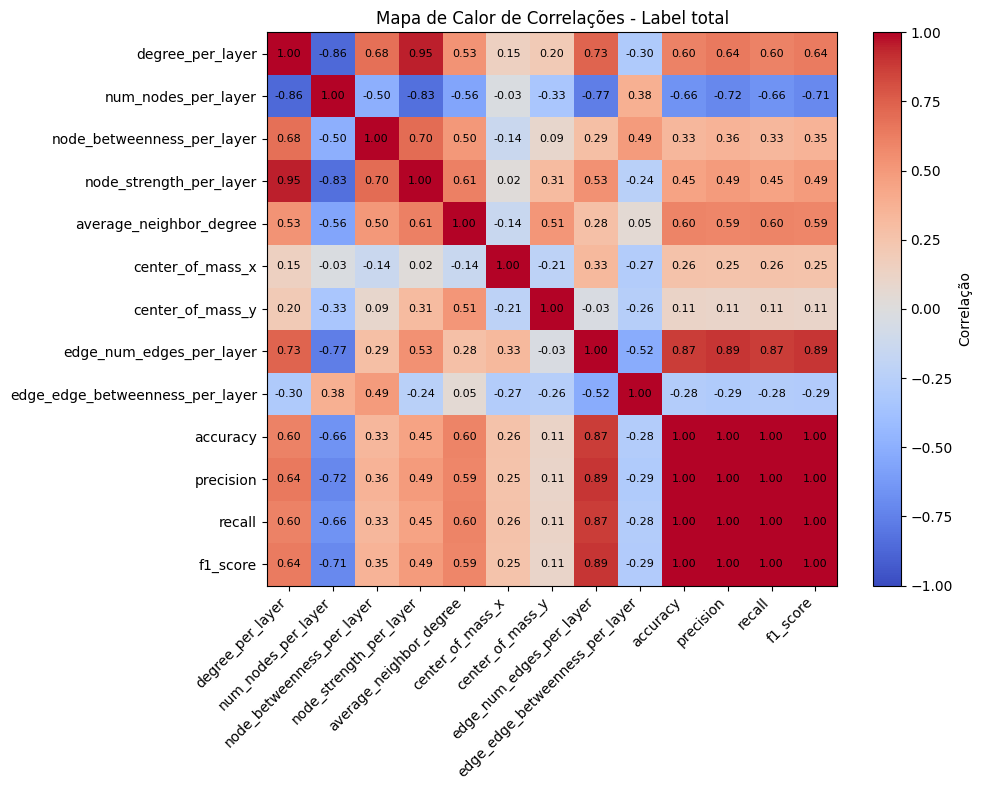

Carregando rótulos do dataset: word_content


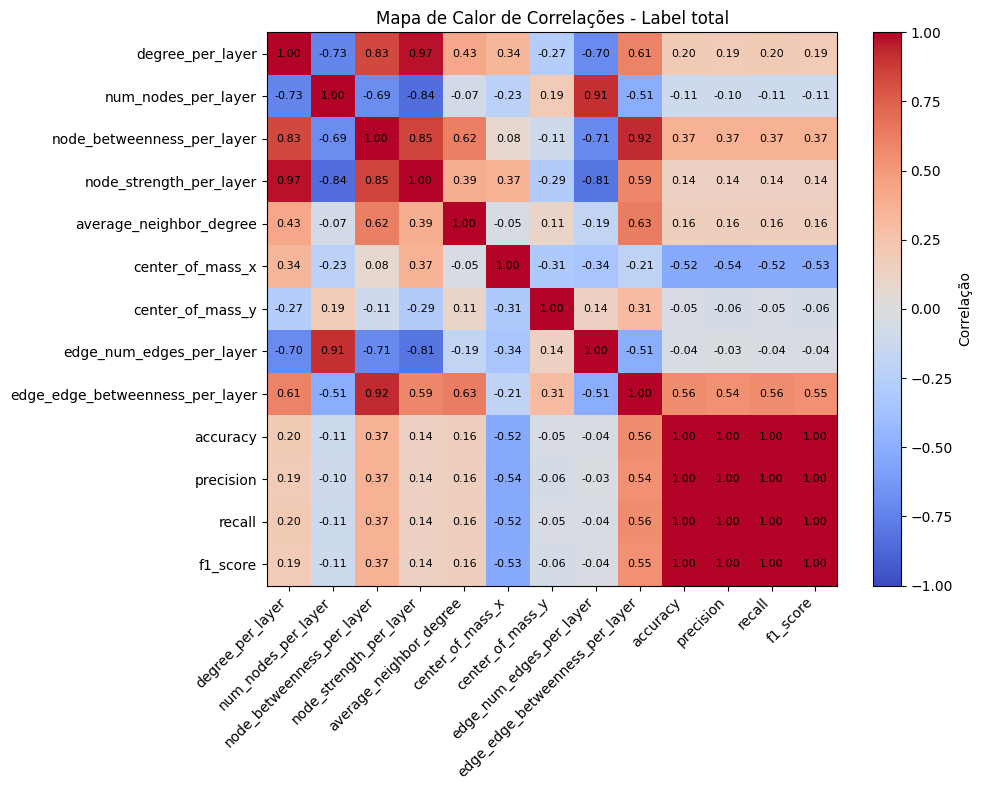

TASK TYPE: syntactic
Carregando rótulos do dataset: bigram_shift


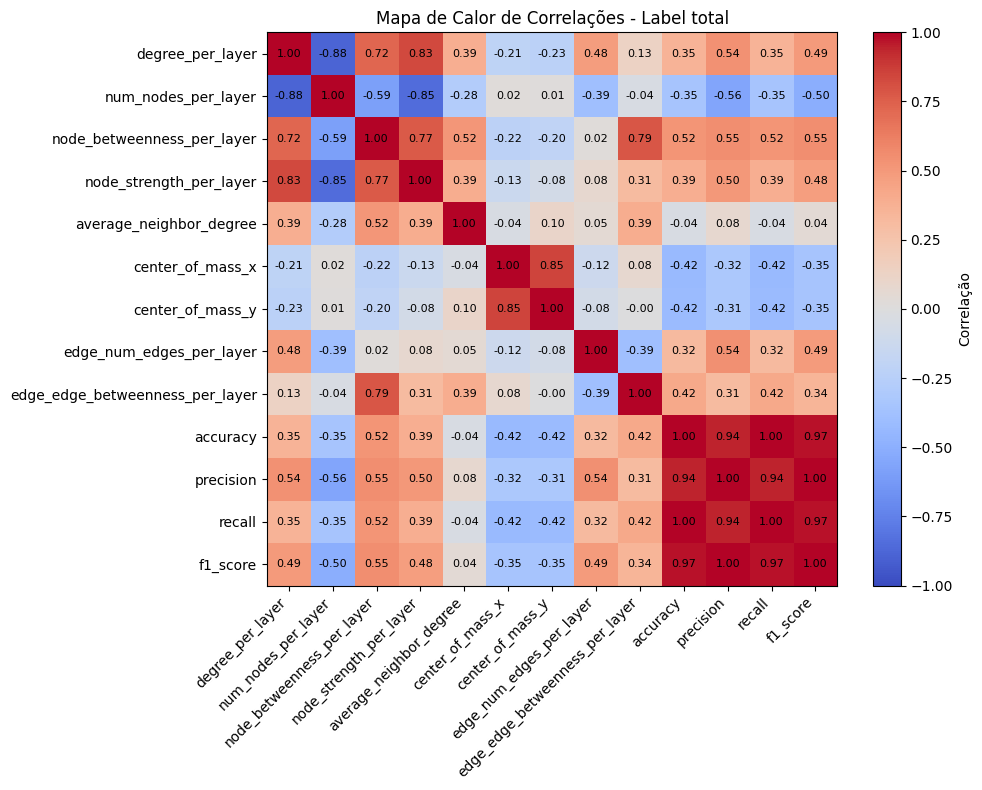

Carregando rótulos do dataset: tree_depth


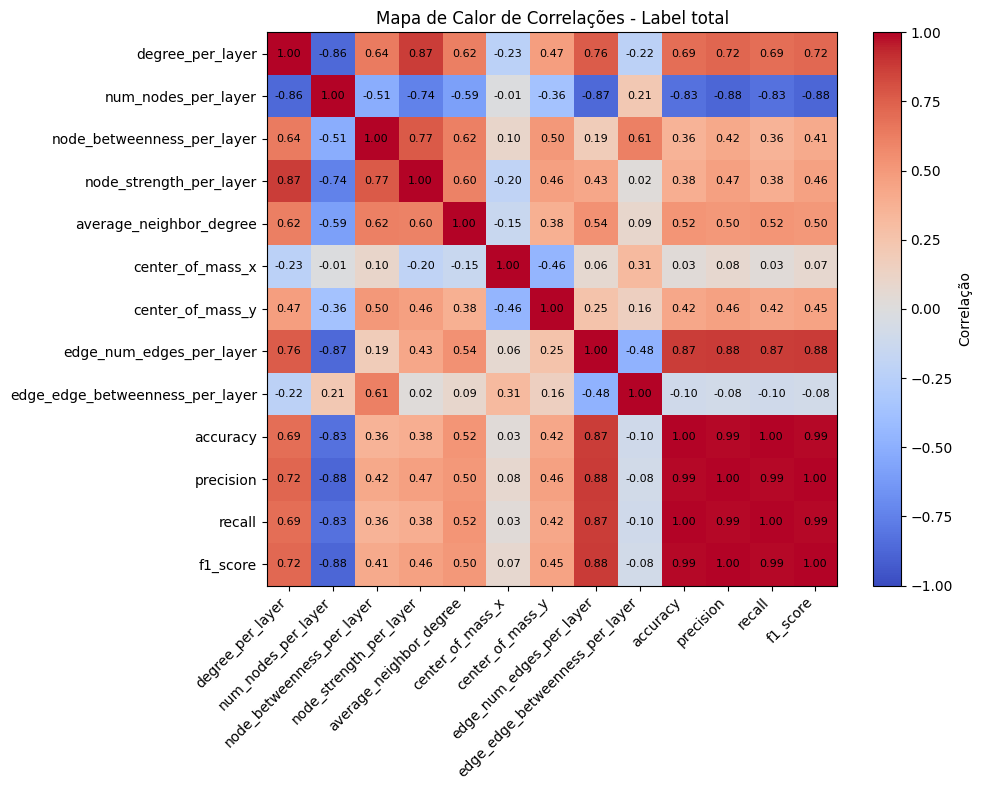

TASK TYPE: semantic
Carregando rótulos do dataset: odd_man_out


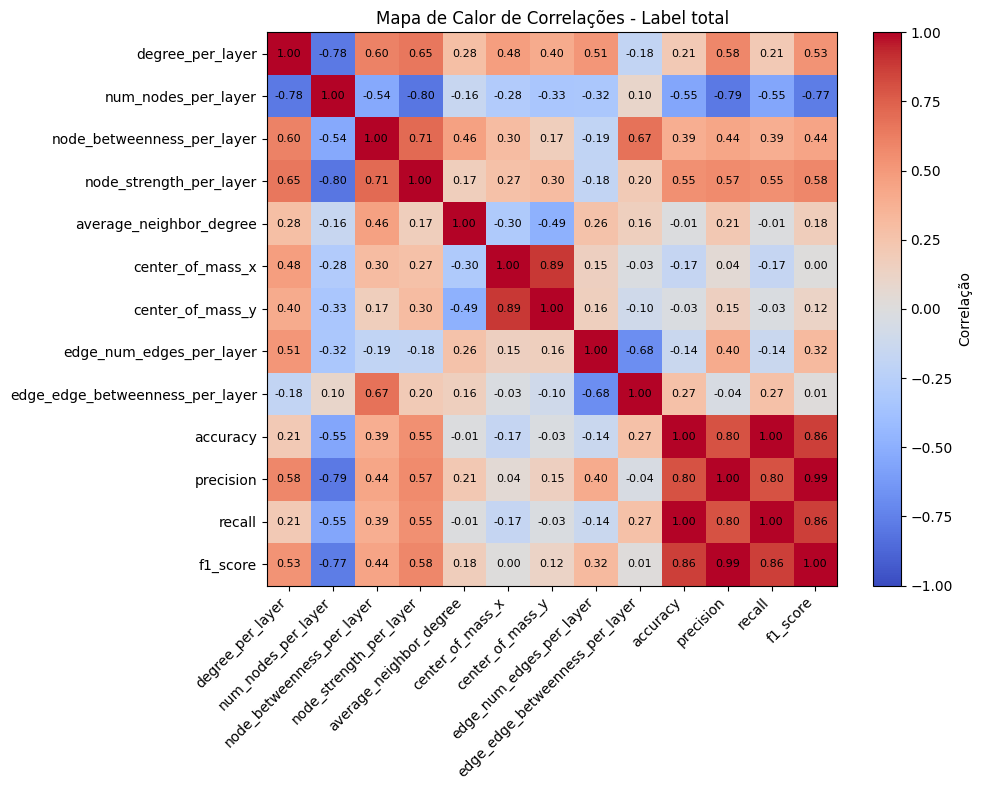

Carregando rótulos do dataset: subj_number


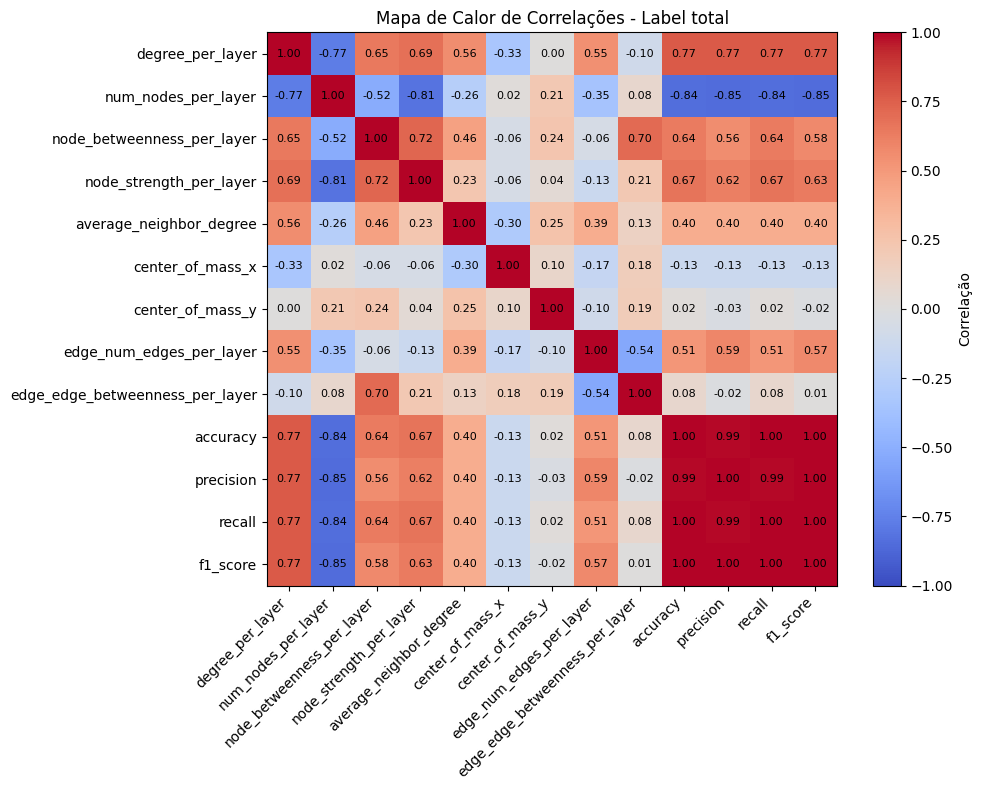

In [6]:
labels_dict = get_labels_dict()

for task_type, labels_dict in DATASETS_MAP.items():
  print("====================================================")
  print(f"TASK TYPE: {task_type}")
  print("====================================================")

  for dataset_name in labels_dict:
      print(f"Carregando rótulos do dataset: {dataset_name}")

      # if dataset_name == "word_content": 
      #   print(f"skipping {dataset_name} - 1_000 labels found")
      #   continue
      # for label in labels_dict[dataset_name]:
      for label in ["total"]:
        
          df_metrics = pd.read_csv(f'{PROCESSED_DATASET_PATH}/metrics_per_layer_{dataset_name}_{label}.csv')
          df_probing = pd.read_csv(f'{PROCESSED_DATASET_PATH}/probing_{dataset_name}_results.csv')

          # Merge dos DataFrames com base na coluna 'layer'
          df_merged = pd.merge(df_metrics, df_probing[['layer', 'accuracy','precision','recall','f1_score']], on='layer', how='inner')
          df_merged = df_merged.drop('layer', axis=1)

          # Calcular correlações e gerar mapa de calor
          correlation_matrix = df_merged.corr(numeric_only=True)
          
          plt.figure(figsize=(10, 8))
          plt.imshow(correlation_matrix, cmap='coolwarm', aspect='auto', vmin=-1, vmax=1)
          plt.colorbar(label='Correlação')
          plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=45, ha='right')
          plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
          
          # Adicionar valores de correlação dentro das células
          for i in range(len(correlation_matrix.columns)):
            for j in range(len(correlation_matrix.columns)):
              plt.text(j, i, f'{correlation_matrix.iloc[i, j]:.2f}',
                  ha='center', va='center', color='black', fontsize=8)
          
          plt.title(f'Mapa de Calor de Correlações - Label {label}')
          plt.tight_layout()
          plt.show()


# Correlation Without first layer

In [ ]:
labels_dict = get_labels_dict()

for task_type, labels_dict in DATASETS_MAP.items():
  print("====================================================")
  print(f"TASK TYPE: {task_type}")
  print("====================================================")

  for dataset_name in labels_dict:
      print(f"Carregando rótulos do dataset: {dataset_name}")

      # if dataset_name == "word_content": 
      #   print(f"skipping {dataset_name} - 1_000 labels found")
      #   continue
      # for label in labels_dict[dataset_name]:
      for label in ["total"]:
        
          df_metrics = pd.read_csv(f'{PROCESSED_DATASET_PATH}/metrics_per_layer_{dataset_name}_{label}.csv')
          # Remove row with layer 0 (input layer) from df_metrics
          df_metrics = df_metrics[df_metrics['layer'] != 0]
          
          
          df_probing = pd.read_csv(f'{PROCESSED_DATASET_PATH}/probing_{dataset_name}_results.csv')
          # Remove row with layer 0 (input layer) from df_metrics
          df_probing = df_probing[df_probing['layer'] != 0]
          
          
          # Merge dos DataFrames com base na coluna 'layer'
          df_merged = pd.merge(df_metrics, df_probing[['layer', 'accuracy','precision','recall','f1_score']], on='layer', how='inner')
          df_merged = df_merged.drop('layer', axis=1)

          # Calcular correlações e gerar mapa de calor
          correlation_matrix = df_merged.corr(numeric_only=True)
          
          plt.figure(figsize=(10, 8))
          plt.imshow(correlation_matrix, cmap='coolwarm', aspect='auto', vmin=-1, vmax=1)
          plt.colorbar(label='Correlação')
          plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=45, ha='right')
          plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
          
          # Adicionar valores de correlação dentro das células
          for i in range(len(correlation_matrix.columns)):
            for j in range(len(correlation_matrix.columns)):
              plt.text(j, i, f'{correlation_matrix.iloc[i, j]:.2f}',
                  ha='center', va='center', color='black', fontsize=8)
          
          plt.title(f'Mapa de Calor de Correlações - Label {label}')
          plt.tight_layout()
          plt.show()


* Melhores resultados de correlação estão envolvendo número de nós, números de arestas e grau. Esses valores são os mais sensíveis a quantidade de entradas e ao parametro gridsize. Como lidar com isso?
* Filtro que estou fazendo nos NRAGs é problemático? 
* Valores de corelação variam consideravelmente para alguns tasks dentro do mesmo grupo, pensar em como lidar com isso... Talvez o NRAGs capture aspectors mais especificos que a função linguística.


1. Acurácia (Accuracy)É a métrica mais simples: de tudo o que o probe analisou, quanto ele acertou no total (tanto originais quanto invertidos).Fórmula:$$\text{Acurácia} = \frac{VP + VN}{\text{Total}}$$O Problema: Se você tiver 90% de frases originais e apenas 10% invertidas, um modelo que simplesmente chute "Original" para todas terá 90% de acurácia, mas será um modelo inútil para detectar inversões.  

2. Precisão (Precision)Foca na qualidade do alerta positivo. Quando o seu probe diz "esta frase está invertida", o quanto podemos confiar nele?Fórmula:$$\text{Precisão} = \frac{VP}{VP + FP}$$Na prática: Se a precisão for baixa, o probe está dando muitos "alarmes falsos" (dizendo que frases normais estão invertidas).  

3. Recall (Revocação ou Sensibilidade)Foca na abrangência. De todas as frases que estavam realmente invertidas no dataset, quantas o probe conseguiu encontrar?Fórmula:$$\text{Recall} = \frac{VP}{VP + FN}$$Na prática: Se o recall for baixo, o probe está deixando passar muitas frases invertidas sem perceber (muitas omissões).  

4. F1-ScoreO F1-Score é a média harmônica entre a Precisão e o Recall. Ele é a métrica ideal quando você quer um equilíbrio entre não dar alarmes falsos e não deixar passar nada.Fórmula:$$F1 = 2 \cdot \frac{\text{Precisão} \cdot \text{Recall}}{\text{Precisão} + \text{Recall}}$$Por que usar? É a melhor métrica para resumir o desempenho em uma única nota, especialmente se o seu dataset de frases estiver desbalanceado.

# Probing using Metrics

Não parece fazer sentido, pois tenho as metricas por camada. Para o dataset A, categoria X, tenho o número de nós para cada camada. No total tenho menos de 10 metricas por camada, contra 10_000 entradas para usar no probing.  
> Antes de irmos para o código, há um detalhe conceitual muito importante para o probing:
Para treinar o LogisticRegression, nós precisamos que essas métricas sejam extraídas para cada frase individualmente, e não agregadas por classe (como o nome _I.csv sugere, podendo indicar a classe "Inverted").  

_Para o probing precido de metricas "1 para 1" com as frases de entrada_